Function to calcuculate SFC

In [1]:
import numpy as np
import zCurve as z

def calculateMortonFromTwoLatLonFloats_with_zCurve(x, y):
    # Cap floating point numbers to six decimal places
    x_int = int( round( (x + 90.0), 6 ) * 100000 )
    y_int = int( round( (y + 180.0), 6 ) * 100000 )
    value = z.interlace(x_int, y_int, dims=2)
    return value
    
def mortonEncode2D(a, b):
    x = np.uint64(a)
    y = np.uint64(b)

    x = (x | (x << np.uint64(16))) & np.uint64(0x0000FFFF0000FFFF)
    x = (x | (x << np.uint64(8)))  & np.uint64(0x00FF00FF00FF00FF)
    x = (x | (x << np.uint64(4)))  & np.uint64(0x0F0F0F0F0F0F0F0F)
    x = (x | (x << np.uint64(2)))  & np.uint64(0x3333333333333333)
    x = (x | (x << np.uint64(1)))  & np.uint64(0x5555555555555555)

    y = (y | (y << np.uint64(16))) & np.uint64(0x0000FFFF0000FFFF)
    y = (y | (y << np.uint64(8)))  & np.uint64(0x00FF00FF00FF00FF)
    y = (y | (y << np.uint64(4)))  & np.uint64(0x0F0F0F0F0F0F0F0F)
    y = (y | (y << np.uint64(2)))  & np.uint64(0x3333333333333333)
    y = (y | (y << np.uint64(1)))  & np.uint64(0x5555555555555555)

    result = np.uint64( x | (y << np.uint64(1)) )
    return result

def mortonExtractEvenBits(a):
    x = np.uint64(a)
    
    x = x & np.uint64(0x5555555555555555)
    x = (x | (x >> np.uint64(1)))  & np.uint64(0x3333333333333333)
    x = (x | (x >> np.uint64(2)))  & np.uint64(0x0F0F0F0F0F0F0F0F)
    x = (x | (x >> np.uint64(4)))  & np.uint64(0x00FF00FF00FF00FF)
    x = (x | (x >> np.uint64(8)))  & np.uint64(0x0000FFFF0000FFFF)
    x = (x | (x >> np.uint64(16))) & np.uint64(0x00000000FFFFFFFF)
    
    return x.astype(np.uint32)

def mortonDecode2D(a):
    _a = np.uint64(a)
    
    x = mortonExtractEvenBits(_a)
    y = mortonExtractEvenBits(_a >> np.uint64(1))
    
    return (x, y)

def calculateMortonFromTwoLatLonFloats(x, y):
    _x = np.float32(x)
    _y = np.float32(y)
    # Cap floating point numbers to six decimal places.
    x_int = np.uint32( np.round( (_x + np.float32(90.0) ), 6 ) * np.uint32(100000) )
    y_int = np.uint32( np.round( (_y + np.float32(180.0) ), 6 ) * np.uint32(100000) )
    value = mortonEncode2D(x_int, y_int)
    return value

def calculateTwoLatLonFloatsFromMorton(a):
    pair = mortonDecode2D(a)
    _x = np.float32(pair[0] / np.float32(100000.0) - np.float32(90.0))
    _y = np.float32(pair[1] / np.float32(100000.0) - np.float32(180.0))
    return (_x, _y)


def calculateMortonFromXYAccelerationFloats(x, y):
    _x = np.float32(x)
    _y = np.float32(y)
    # Cap floating point numbers to six decimal places.
    x_int = np.uint32( np.round( (_x + np.float32(10.0) ), 6 ) * np.uint32(100) )
    y_int = np.uint32( np.round( (_y + np.float32(10.0) ), 6 ) * np.uint32(100) )
    value = mortonEncode2D(x_int, y_int)
    return value

def calculateXYAccelerationFloatsFromMorton(a):
    pair = mortonDecode2D(a)
    _x = np.float32(pair[0] / np.float32(100.0) - np.float32(10.0))
    _y = np.float32(pair[1] / np.float32(100.0) - np.float32(10.0))
    return (_x, _y)

### Chunk 2

**b0c9d2329ad1606b|2018-11-11--13-08-44**

set 17

Here we evaluated our model by using parameter found in the Snowfoxdata and applying to the comma2k19 dataset. We plotted the segments from each chunk and applied the box found in the Snowfoxdata.

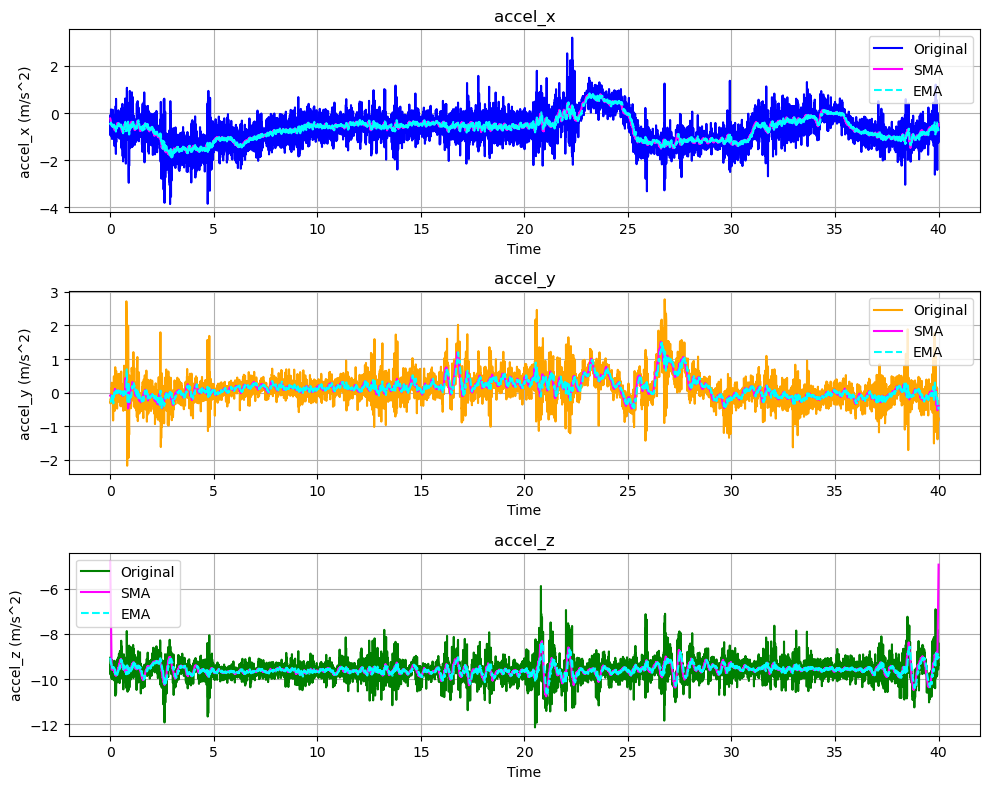

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value17_2018-11-11--13-08-44')
data_t = np.load('t17_2018-11-11--13-08-44')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(10, 8))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [3]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set17 = []
set17_A = []
set17_B = []
time17 = []
group_A = []
group_B = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 22 and time < 29:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set17_A.append(morton)
            time_norm = time -22
            set17.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set17_B.append(morton)
            time_norm = time -22
            set17.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set17 = pd.DataFrame(set17, columns=['morton','timestamp'])
print(df_set17)




       morton  timestamp
0     1039938   0.001771
1     2457192   0.008160
2     2448576   0.014550
3     2457194   0.020960
4     1048170   0.027349
...       ...        ...
1090  1047784   6.973483
1091  1047624   6.979873
1092  1046242   6.986262
1093  1047776   6.992672
1094  1047648   6.999061

[1095 rows x 2 columns]


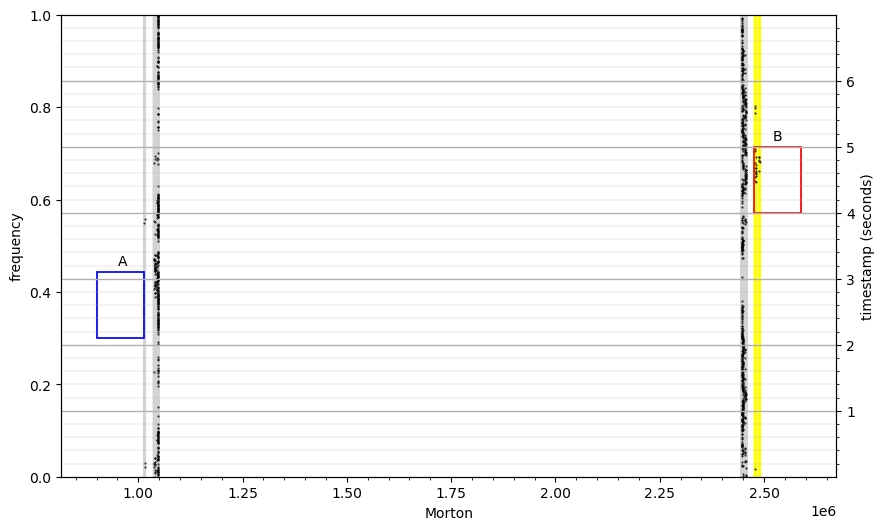

In [4]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set17_A, set17_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set17['morton']
timestamp_seconds = df_set17['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Here there is a lane change happening 22 and 30, we ploted the strip plot and applied the box from the snowfox data. It looks like it could only detect the upper peak of the lane change and not the lower peak. The threshold might need to be changed


**b0c9d2329ad1606b|2018-11-11--13-08-44**

set 21

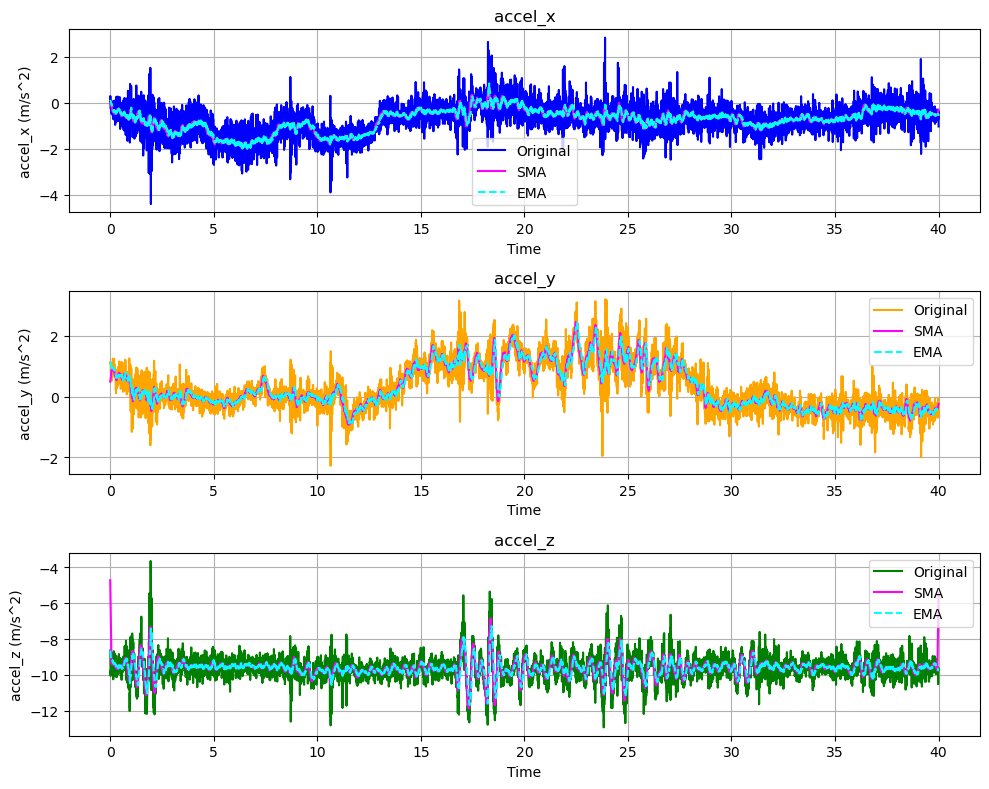

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value21_2018-11-11--13-08-44')
data_t = np.load('t21_2018-11-11--13-08-44')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(10, 8))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [6]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set21_A = []
set21_B = []
set21 = []

for data_point, time in combined_data :
    if time > 8 and time < 15:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set21_A.append(morton)
            time_norm = time -8
            set21.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set21_B.append(morton)
            time_norm = time -8
            set21.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set21 = pd.DataFrame(set21, columns=['morton','timestamp'])
print(df_set21)




       morton  timestamp
0     1045706   0.001362
1     2446434   0.007752
2     1046240   0.014141
3     1047744   0.020551
4     2446408   0.026941
...       ...        ...
1090  2448608   6.973104
1091  2449000   6.979513
1092  2454632   6.985903
1093  2455112   6.992292
1094  2455138   6.998682

[1095 rows x 2 columns]


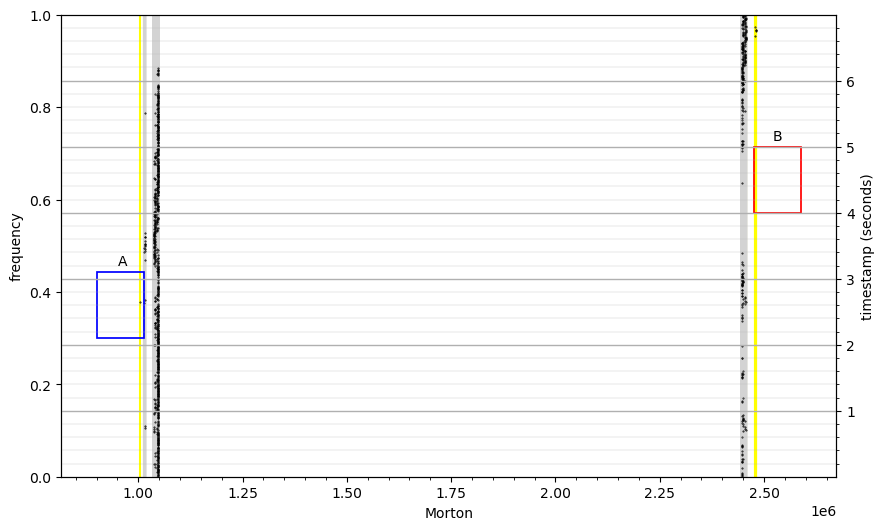

In [7]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set21_A, set21_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set21['morton']
timestamp_seconds = df_set21['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


There is a lane change happening in 10-17 then there is a right road curve. However our model is not able to capture the lane change, since the lane change is happenning for a longer period of time

Chunk_2/b0c9d2329ad1606b|2018-10-05--21-20-29/6

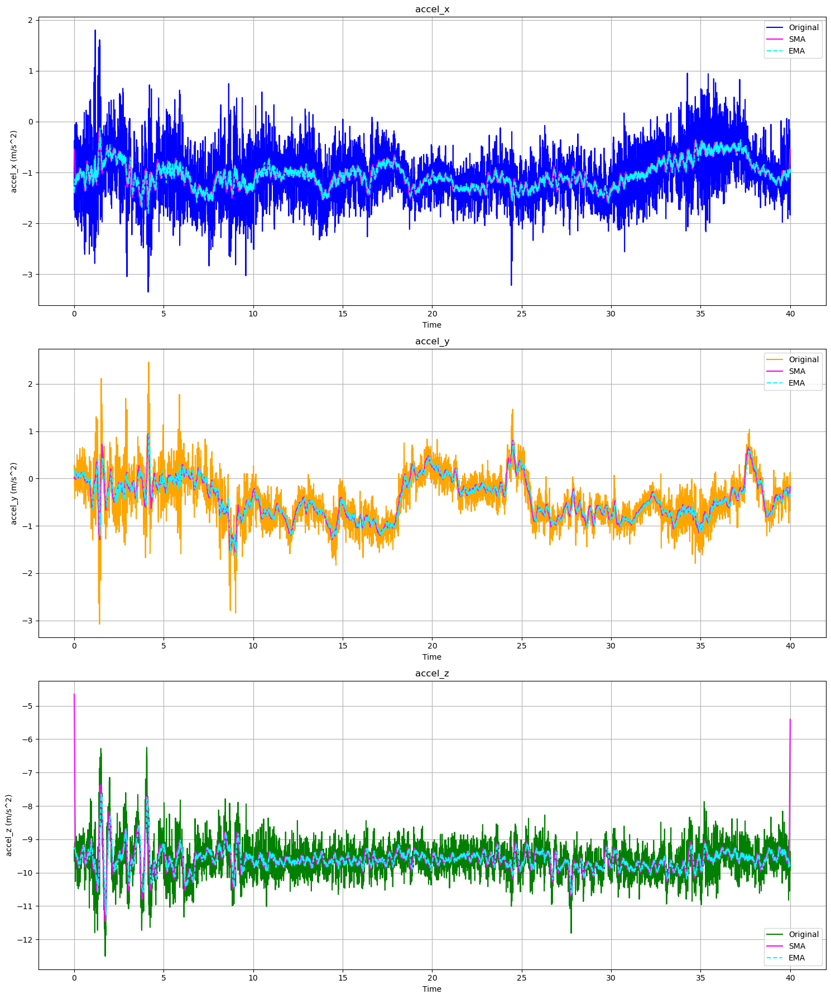

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value6_2018-10-05--21-20-29')
data_t = np.load('t6_2018-10-05--21-20-29')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

This file doesn't have a lane change

Chunk_2/b0c9d2329ad1606b|2018-10-05--21-20-29/13

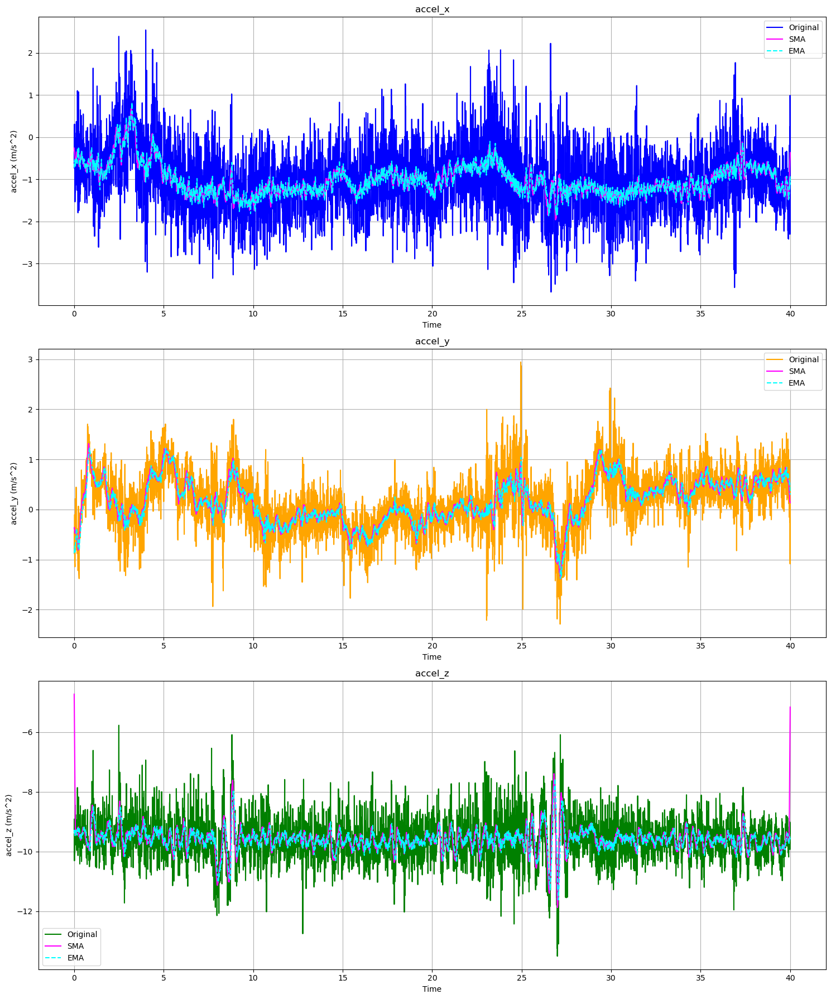

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value13_2018-10-05--21-20-29')
data_t = np.load('t13_2018-10-05--21-20-29')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [10]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set13_A = []
set13_B = []
set13 = []

for data_point, time in combined_data :
    if time > 24.5 and time < 31.5:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_A.append(morton)
            time_norm = time -24.5
            set13.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_B.append(morton)
            time_norm = time -24.5
            set13.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set13 = pd.DataFrame(set13, columns=['morton','timestamp'])
print(df_set13)




       morton  timestamp
0     2446560   0.005168
1     2454632   0.011577
2     1048264   0.017967
3     1048160   0.024356
4     2446528   0.030745
...       ...        ...
1089  1047656   6.969278
1090  2446912   6.975667
1091  2447042   6.982056
1092  2446560   6.988445
1093  1046240   6.994855

[1094 rows x 2 columns]


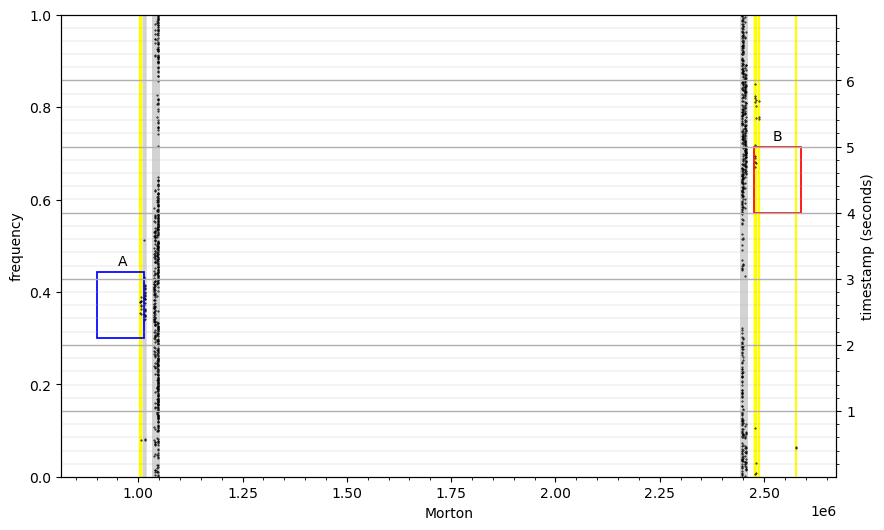

In [11]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set13_A, set13_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set13['morton']
timestamp_seconds = df_set13['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Here there is two lane change happpening kind of one after the other, however in the graph they are mashed as one lane change happenning between 24.5 - 33. And our model seems to capture it, however it is  right lane change that means its wrong, probably false positive. 
There is a right lane change happenning from 9-11.
Look more into the right lane change happenning at 25.

Chunk_2/b0c9d2329ad1606b|2018-10-05--21-20-29/8

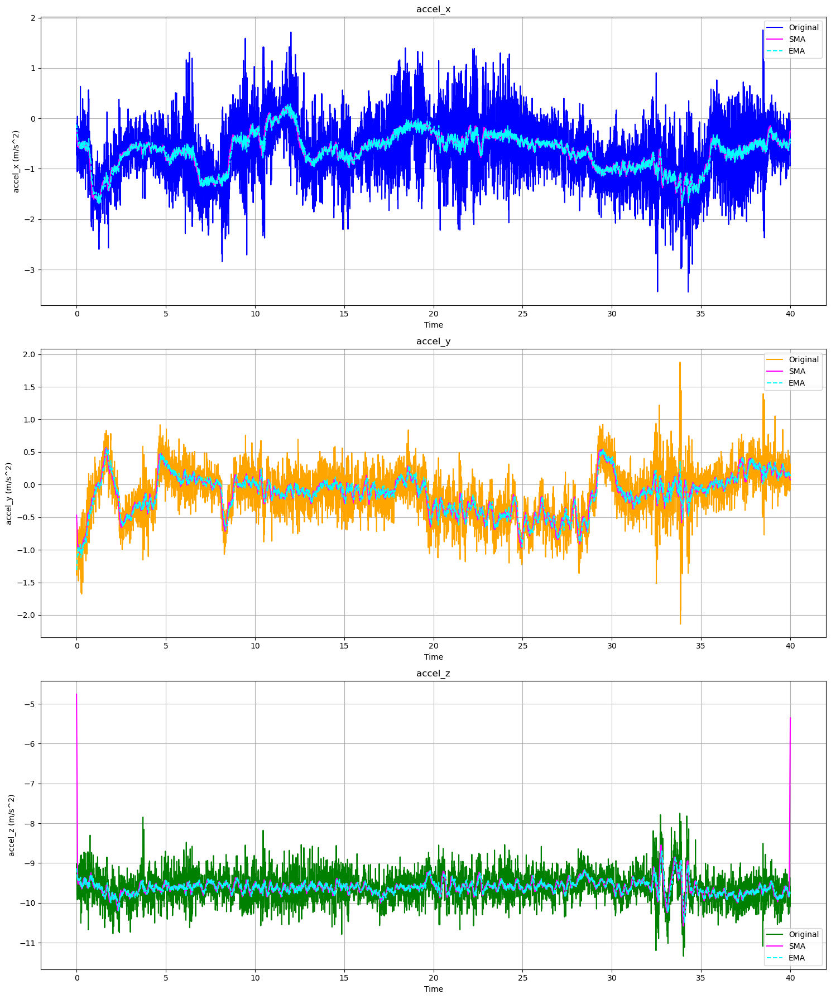

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value8_2018-10-05--21-20-29')
data_t = np.load('t8_2018-10-05--21-20-29')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [13]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set8_A = []
set8_B = []
set8 = []

for data_point, time in combined_data :
    if time > 3 and time < 10:
        if data_point < -1 or data_point > 1:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set8_A.append(morton)
            time_norm = time -3
            set8.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set8_B.append(morton)
            time_norm = time -3
            set8.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set8 = pd.DataFrame(set8, columns=['morton','timestamp'])
print(df_set8)




       morton  timestamp
0     1045576   0.005524
1     1045570   0.011914
2     1039562   0.018344
3     1039426   0.024733
4     1040074   0.031122
...       ...        ...
1089  1047746   6.969619
1090  1047752   6.976009
1091  1046240   6.982398
1092  1048138   6.988787
1093  1047626   6.995197

[1094 rows x 2 columns]


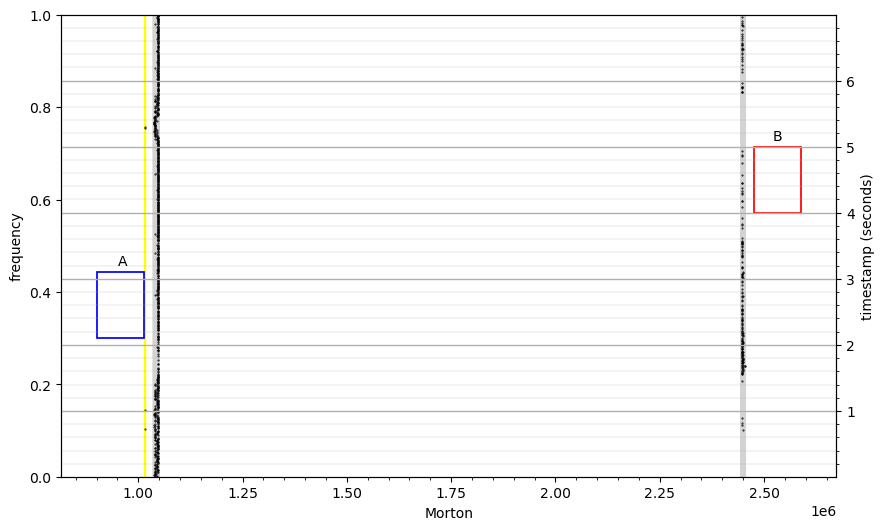

In [14]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set8_A, set8_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set8['morton']
timestamp_seconds = df_set8['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


The lane change is too low meanning the peaks doesnt excede 1m/s which means our model doesn't capture it. Also the lane change happens in one second however our model capture s the ones happens in 3 seconds 

Chunk_2/b0c9d2329ad1606b|2018-10-05--20-46-40/9

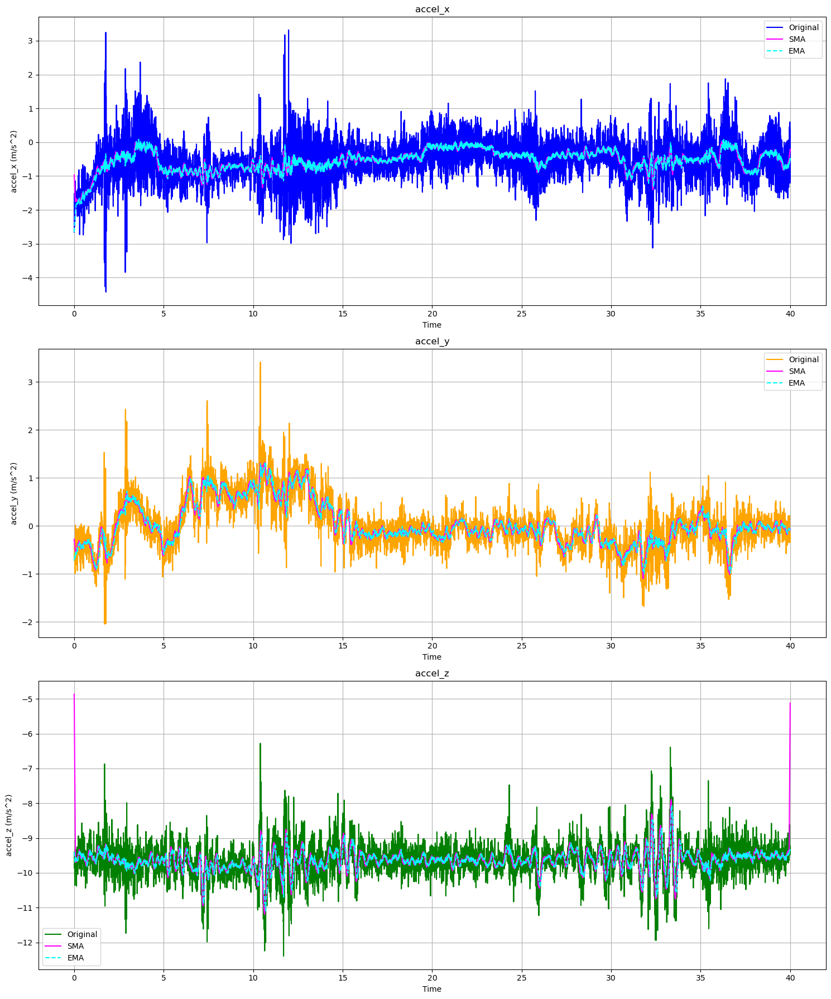

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value9_2018-10-05--20-46-40')
data_t = np.load('t9_2018-10-05--20-46-40')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [16]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set9_A = []
set9_B = []
set9 = []

for data_point, time in combined_data :
    if time > 0 and time < 6:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set9_A.append(morton)
            time_norm = time + 1
            set9.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set9_B.append(morton)
            time_norm = time + 1
            set9.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set9 = pd.DataFrame(set9, columns=['morton','timestamp'])
print(df_set9)




      morton  timestamp
0    1039936   1.006389
1    1039970   1.012799
2    1045568   1.019188
3    1045602   1.025578
4    1039970   1.031987
..       ...        ...
933  2446402   6.973008
934  1048136   6.979417
935  2448994   6.985807
936  2448458   6.992196
937  2448618   6.998585

[938 rows x 2 columns]


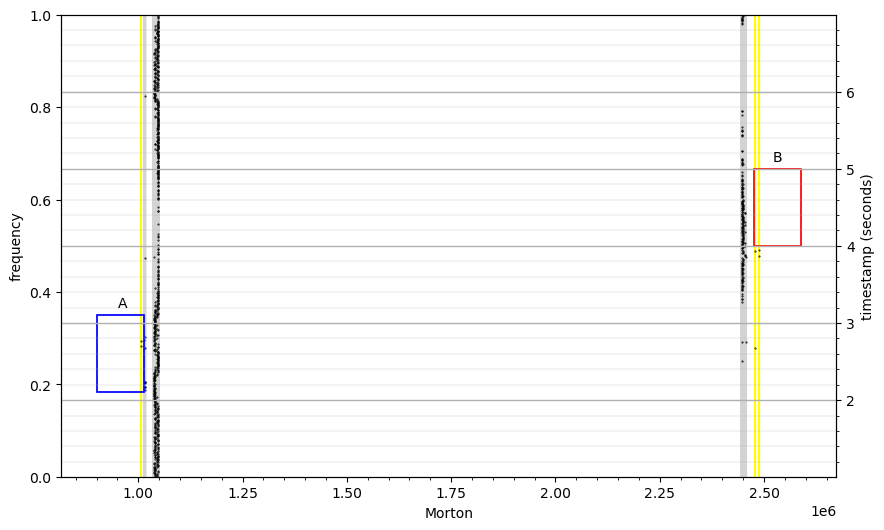

In [17]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set9_A, set9_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set9['morton']
timestamp_seconds = df_set9['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


As we can see the model was abel to capture one of the peaks since the duration of the lane change is relatively less than the model. Therefore the lane changes tends to very from 1 to 5 seconds

Chunk_2/b0c9d2329ad1606b|2018-10-05--20-16-56/10

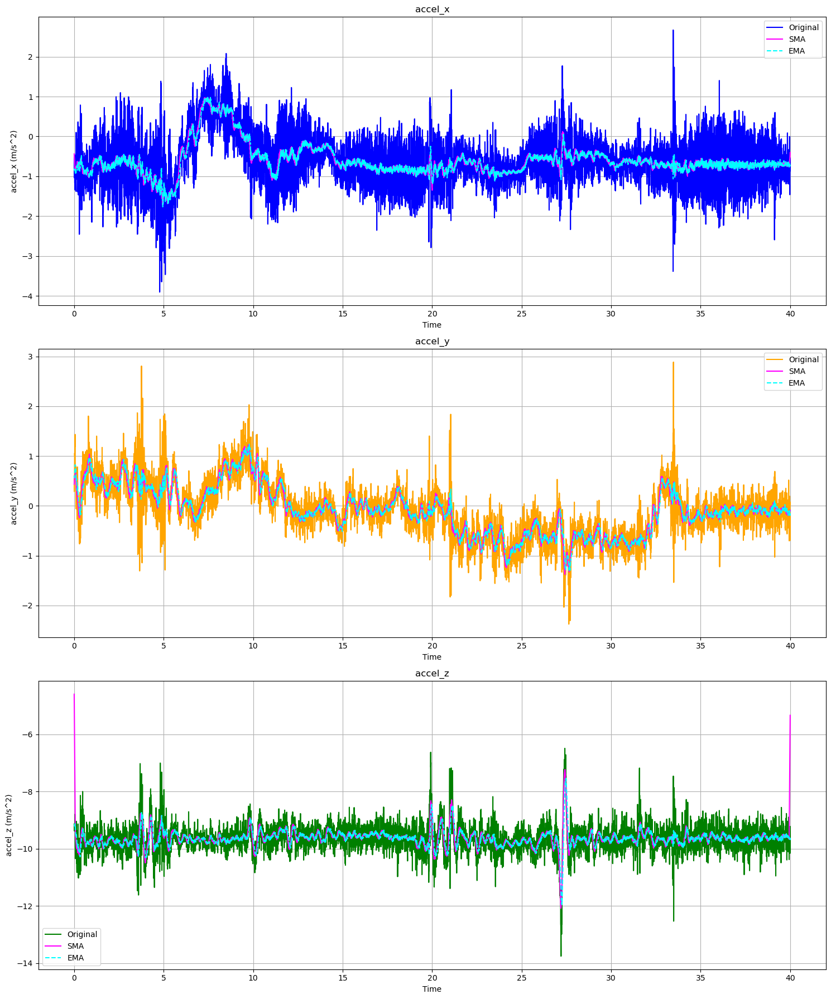

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value10_2018-10-05--20-16-56')
data_t = np.load('t10_2018-10-05--20-16-56')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [19]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set10_A = []
set10_B = []
set10 = []

for data_point, time in combined_data :
    if time > 5 and time < 12:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set10_A.append(morton)
            time_norm = time - 5
            set10.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set10_B.append(morton)
            time_norm = time - 5
            set10.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set10 = pd.DataFrame(set10, columns=['morton','timestamp'])
print(df_set10)




       morton  timestamp
0     2446440   0.000008
1     2448960   0.006417
2     1048296   0.012806
3     2448618   0.019195
4     1048288   0.025584
...       ...        ...
1090  2446440   6.969315
1091  2446912   6.975704
1092  2446560   6.982093
1093  1048168   6.988481
1094  1048298   6.994891

[1095 rows x 2 columns]


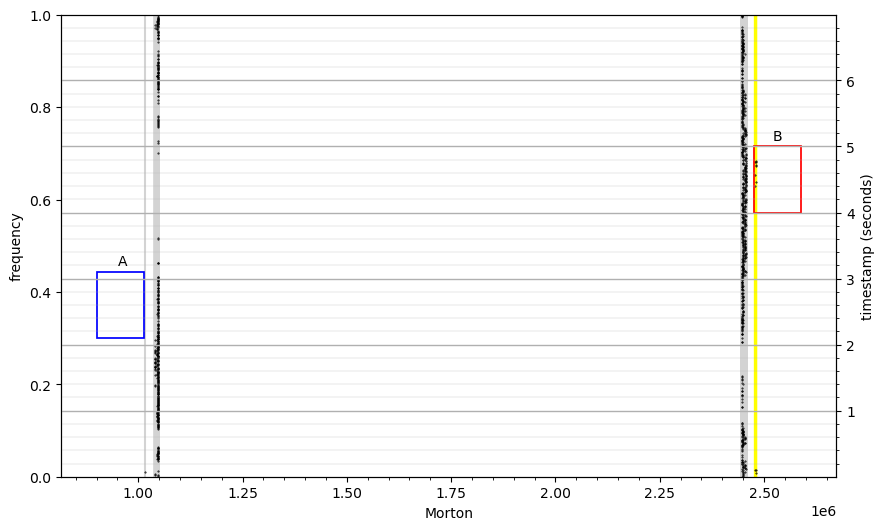

In [20]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set10_A, set10_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set10['morton']
timestamp_seconds = df_set10['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Here our model was able to capture on of the peaks again, because the box A doesn't fall under the threshold we defined.

Chunk_2/b0c9d2329ad1606b|2018-10-05--20-16-56/13

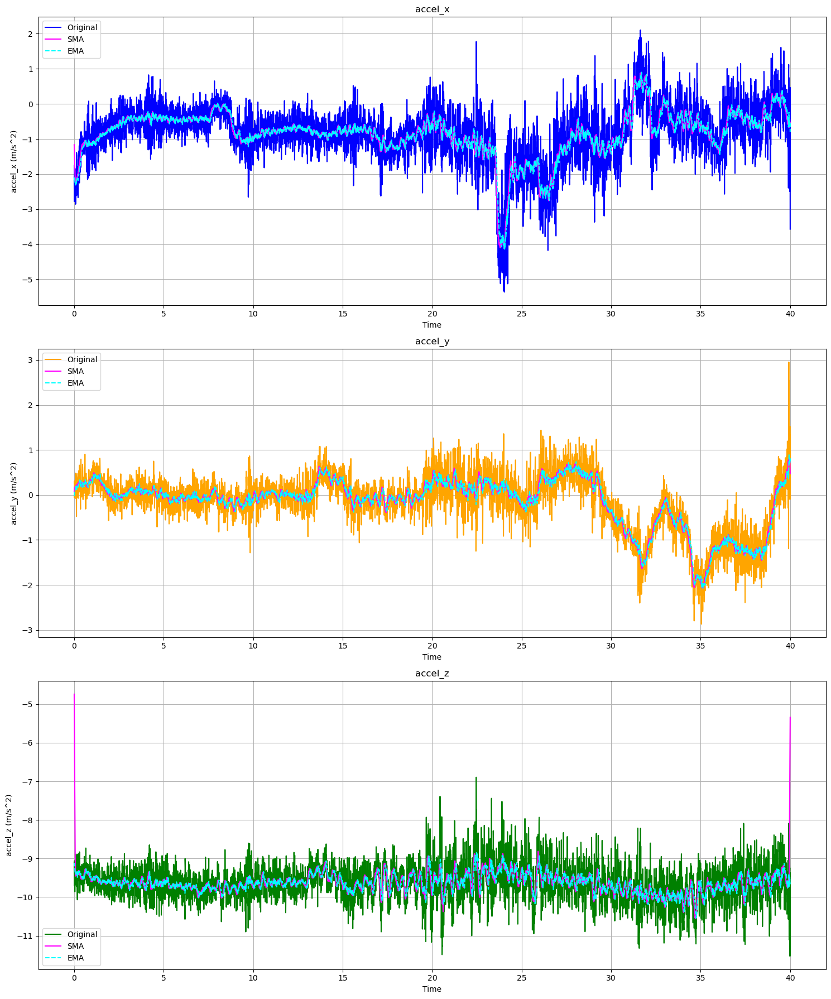

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value13_2018-10-05--20-16-56')
data_t = np.load('t13_2018-10-05--20-16-56')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [22]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set13_A1 = []
set13_B1 = []
set13_1 = []

for data_point, time in combined_data :
    if time > 29 and time < 36:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_A1.append(morton)
            time_norm = time - 29
            set13_1.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_B1.append(morton)
            time_norm = time - 29
            set13_1.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set13_1 = pd.DataFrame(set13_1, columns=['morton','timestamp'])
print(df_set13_1)




       morton  timestamp
0     2446562   0.000262
1     2448490   0.006672
2     2454720   0.013082
3     1048128   0.019471
4     1048256   0.025861
...       ...        ...
1090  1012930   6.971017
1091  1007306   6.977407
1092  1013440   6.983817
1093  1013314   6.990207
1094  1013440   6.996596

[1095 rows x 2 columns]


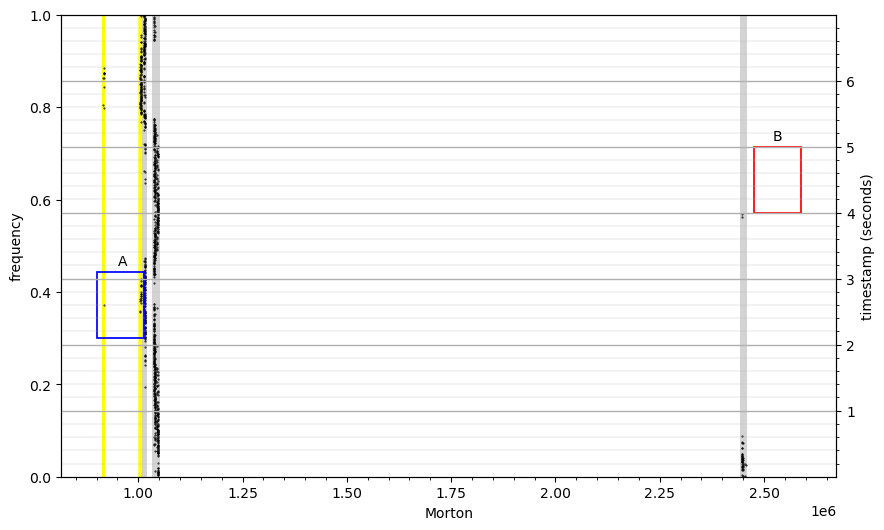

In [23]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set13_A1, set13_B1]
data_colors = ['yellow', 'lightgray']

morton17 = df_set13_1['morton']
timestamp_seconds = df_set13_1['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


We can see a lane change happening betweern 30-35 seconds but due to a curvy road to the left the pattern seems to  be happening a bit downwards than the original margin. Maybe our model needs to accomodate for curvy roads, saying that if curvy road to left, adjust acceleration i.e morton value.

Chunk_2/b0c9d2329ad1606b|2018-09-24--12-49-08/28

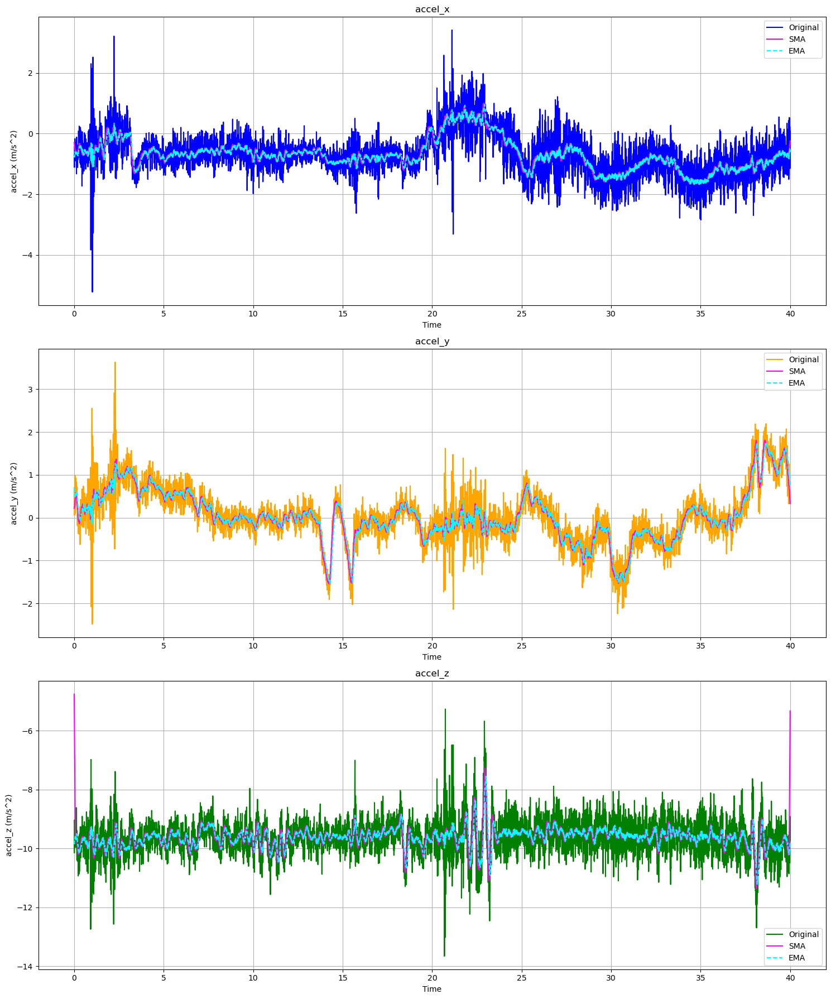

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value28_2018-09-24--12-49-08')
data_t = np.load('t28_2018-09-24--12-49-08')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [25]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set28_A = []
set13_B = []
set13 = []

for data_point, time in combined_data :
    if time > 29 and time < 36:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_A.append(morton)
            time_norm = time - 29
            set13.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_B.append(morton)
            time_norm = time - 29
            set13.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set13 = pd.DataFrame(set13, columns=['morton','timestamp'])
print(df_set13)




       morton  timestamp
0     1046122   0.005113
1     1039970   0.011523
2     1037376   0.017913
3     1037928   0.024302
4     1045608   0.030712
...       ...        ...
1089  1047626   6.970377
1090  1046088   6.976767
1091  1046242   6.983156
1092  1046082   6.989546
1093  1039978   6.995955

[1094 rows x 2 columns]


Was not able to see a proper lane change from 20-25 seconds, since we saw in the video

Chunk_2/b0c9d2329ad1606b|2018-09-23--12-52-06/42

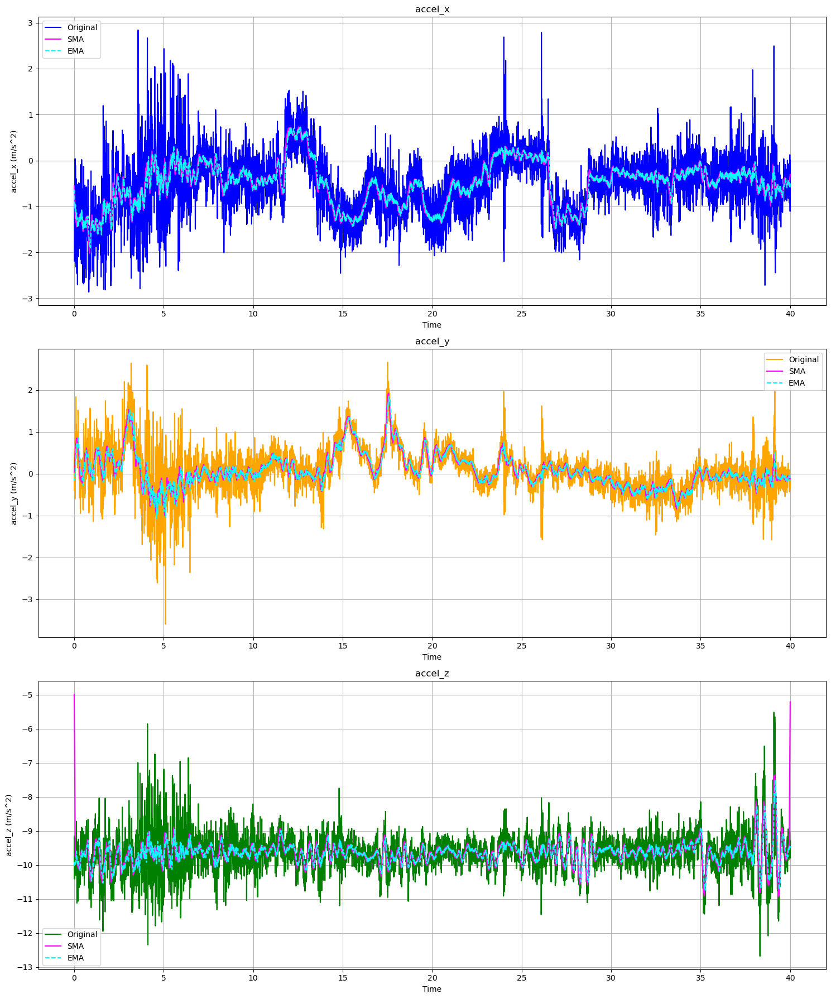

In [26]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value42_2018-09-23--12-52-06')
data_t = np.load('t42_2018-09-23--12-52-06')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [27]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set42_A = []
set42_B = []
set42 = []

for data_point, time in combined_data :
    if time > 10.5 and time < 17.5:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set42_A.append(morton)
            time_norm = time - 10.5
            set42.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set42_B.append(morton)
            time_norm = time - 10.5
            set42.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set42 = pd.DataFrame(set42, columns=['morton','timestamp'])
print(df_set42)




       morton  timestamp
0     1047778   0.002062
1     2447080   0.008451
2     1047752   0.014882
3     1047752   0.021271
4     1045576   0.027661
...       ...        ...
1090  2457152   6.973494
1091  2456640   6.979883
1092  2456810   6.986273
1093  2481344   6.992683
1094  2488008   6.999072

[1095 rows x 2 columns]


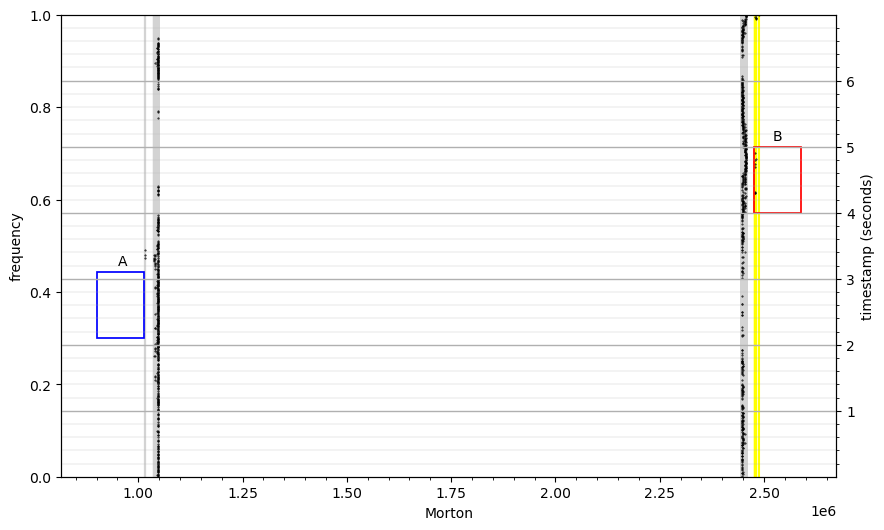

In [28]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set42_A, set42_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set42['morton']
timestamp_seconds = df_set42['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Here there is two lanw change happening from 13- 17 and another one from 22-26, but only the first one is recognizable therefore we applied our model on the first one. As we can see only box B was captured not A. A wasn't captured due to threshold and duration both in this case.

Chunk_2/b0c9d2329ad1606b|2018-09-23--12-52-06/47

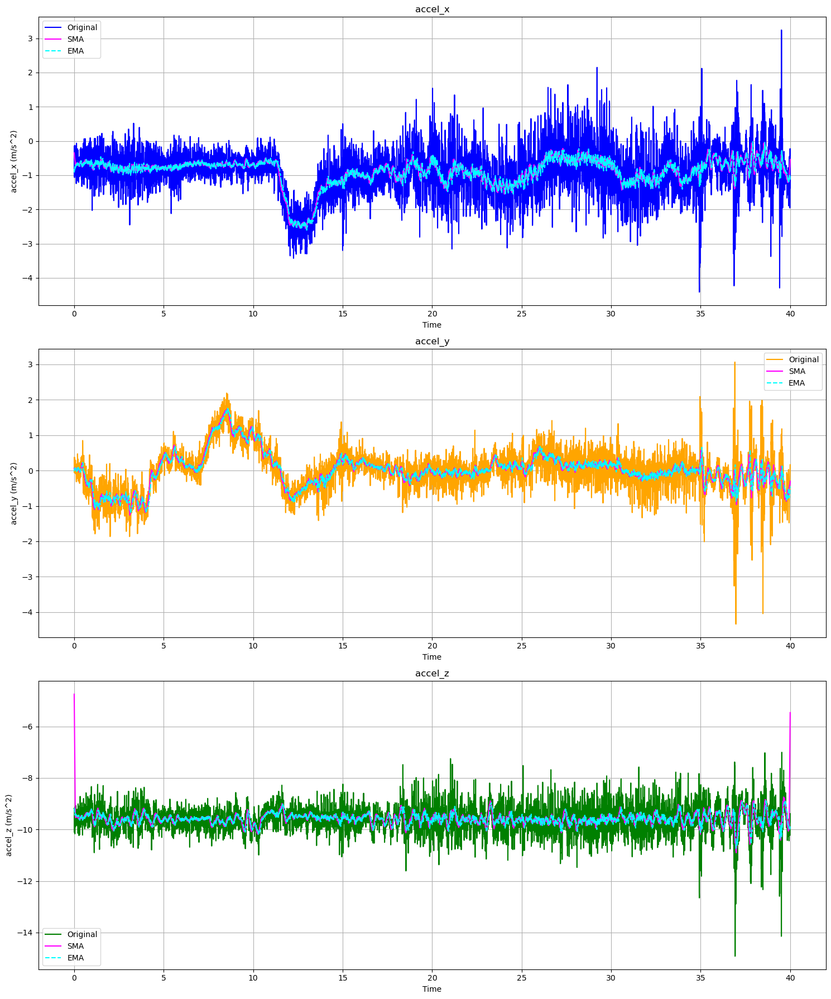

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value47_2018-09-23--12-52-06')
data_t = np.load('t47_2018-09-23--12-52-06')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [30]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set47_A = []
set47_B = []
set47 = []

for data_point, time in combined_data :
    if time > 10.5 and time < 17.5:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set47_A.append(morton)
            time_norm = time - 10.5
            set47.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set47_B.append(morton)
            time_norm = time - 10.5
            set47.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set47 = pd.DataFrame(set47, columns=['morton','timestamp'])
print(df_set47)




       morton  timestamp
0     2446912   0.002228
1     1047650   0.008618
2     1048138   0.015008
3     1048170   0.021418
4     2447040   0.027796
...       ...        ...
1090  1046250   6.973696
1091  1048128   6.980106
1092  2446914   6.986516
1093  2447048   6.992906
1094  2446570   6.999295

[1095 rows x 2 columns]


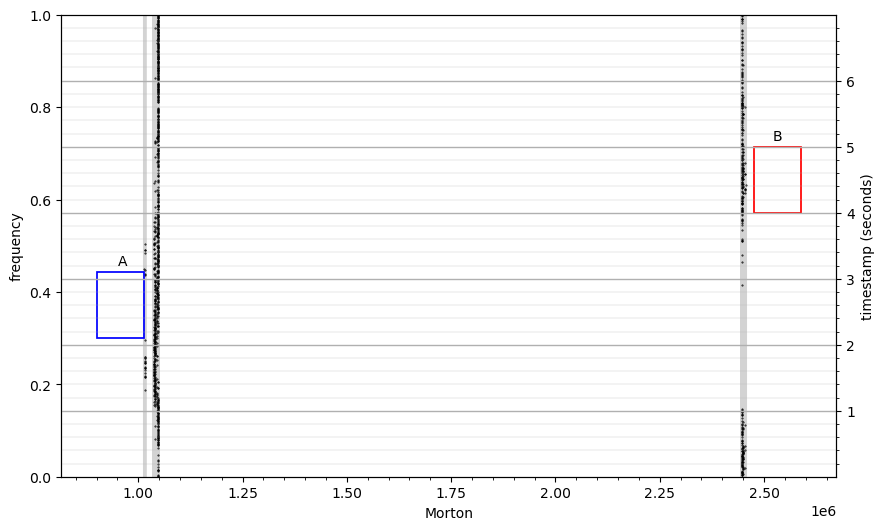

In [31]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set47_A, set47_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set47['morton']
timestamp_seconds = df_set47['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Our model couldn't capture the lane change happening from 10-15 because of threshold again. Having value of 1.2 would have captured the peaks.

Chunk_2/b0c9d2329ad1606b|2018-09-21--23-18-39/2

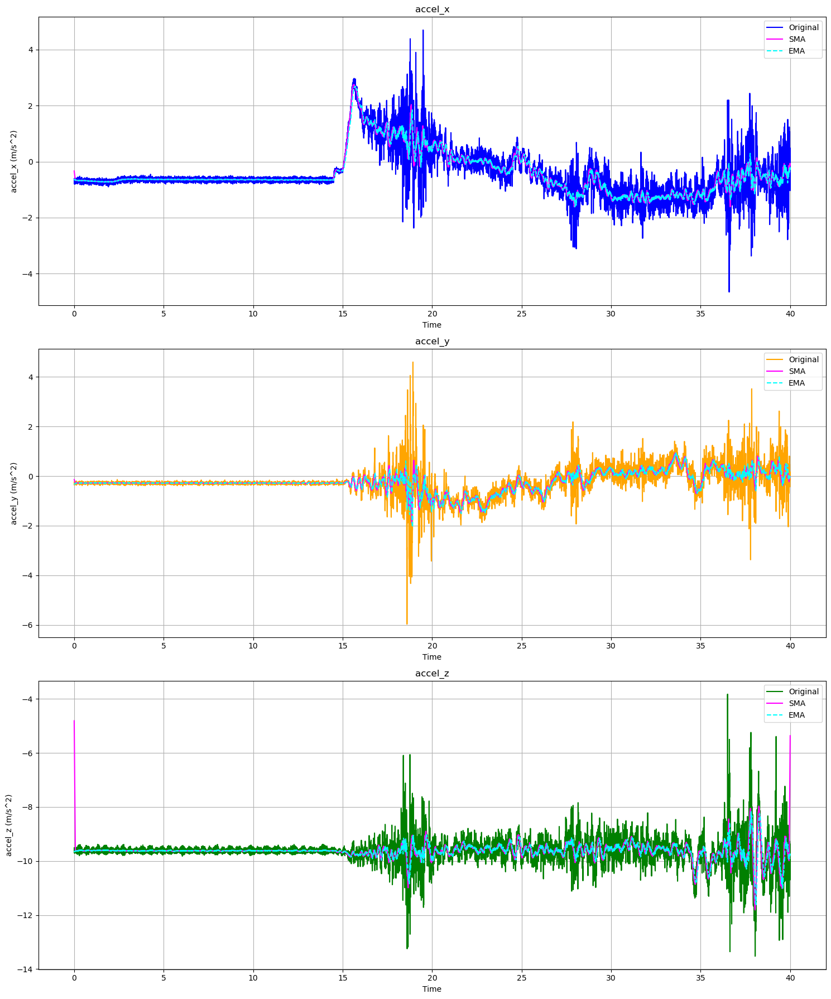

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value2_2018-09-21--23-18-39')
data_t = np.load('t2_2018-09-21--23-18-39')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [33]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set2_A = []
set2_B = []
set2 = []

for data_point, time in combined_data :
    if time > 23 and time < 30:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set2_A.append(morton)
            time_norm = time - 23
            set2.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set2_B.append(morton)
            time_norm = time - 23
            set2.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set2 = pd.DataFrame(set2, columns=['morton','timestamp'])
print(df_set2)




       morton  timestamp
0     1012936   0.004949
1     1014850   0.011358
2     1015522   0.017748
3     1015400   0.024137
4     1013472   0.030526
...       ...        ...
1090  2446408   6.974248
1091  2446410   6.980658
1092  2446408   6.987047
1093  2446442   6.993457
1094  1048168   6.999846

[1095 rows x 2 columns]


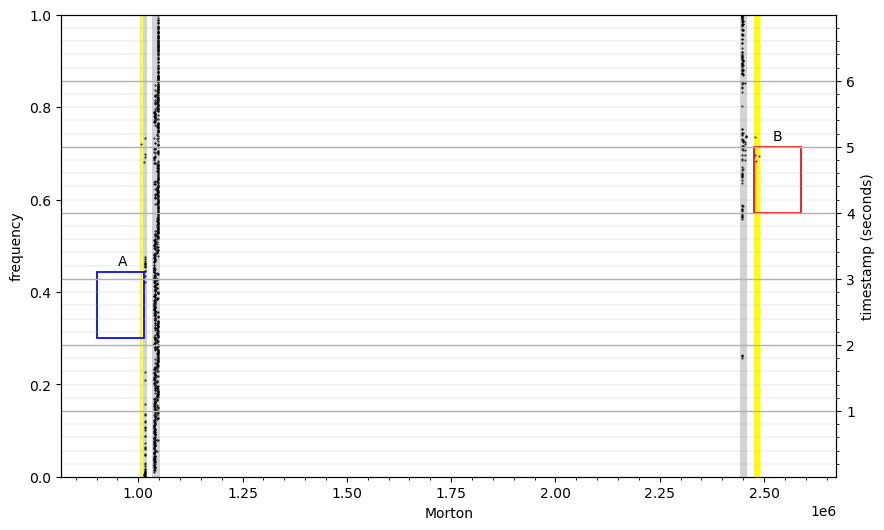

In [34]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set2_A, set2_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set2['morton']
timestamp_seconds = df_set2['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Here we can see that our model was once again only able to get box B. Box A could have been captured by adjusting the duration and threshold

***Chunk 1***

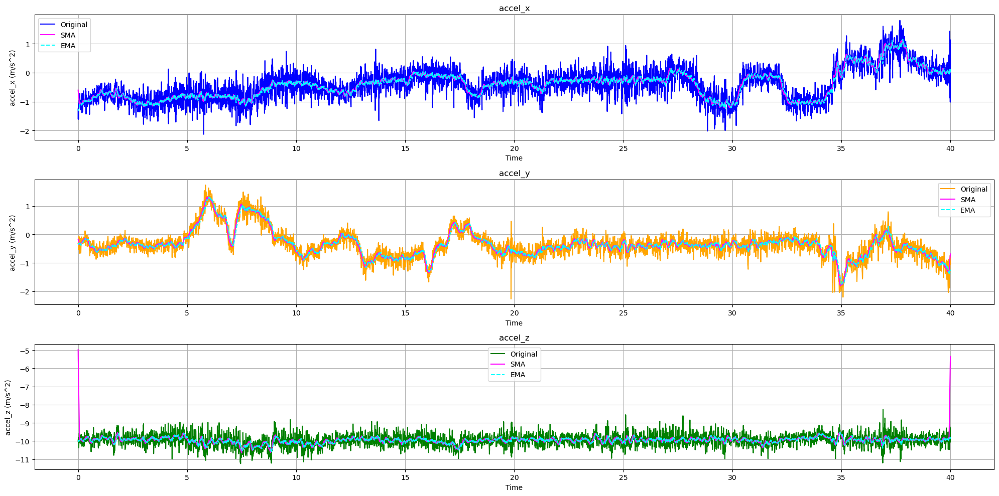

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value7_2018-07-27-06-03-57')
data_t = np.load('t7_2018-07-27-06-03-57')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 10))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    #plt.xlim(33, 40)
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [36]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set7 = []
set7_A = []
set7_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 32.5 and time < 39.5:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set7_A.append(morton)
            time_norm = time -32.5
            set7.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set7_B.append(morton)
            time_norm = time -32.5
            set7.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set7 = pd.DataFrame(set7, columns=['morton','timestamp'])
print(df_set7)


       morton  timestamp
0     1046242   0.001053
1     1046248   0.007707
2     1046114   0.014361
3     1046112   0.021015
4     1046218   0.027669
...       ...        ...
1152  1013448   6.967695
1153  1013474   6.974349
1154  1014880   6.981003
1155  1015370   6.987657
1156  1037544   6.994311

[1157 rows x 2 columns]


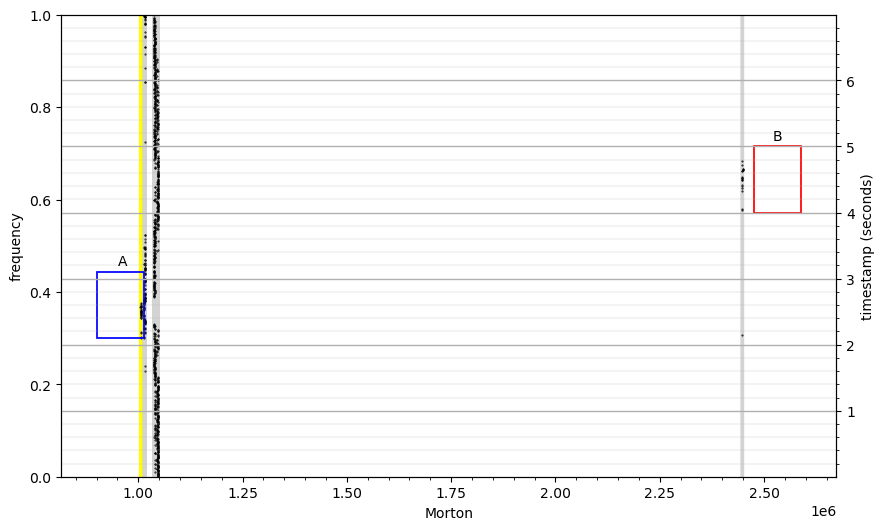

In [37]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set7_A, set7_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set7['morton']
timestamp_seconds = df_set7['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(0.9e6, 1.22e6)
#plt.xlim(2.48e6, 2.5e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Value t3

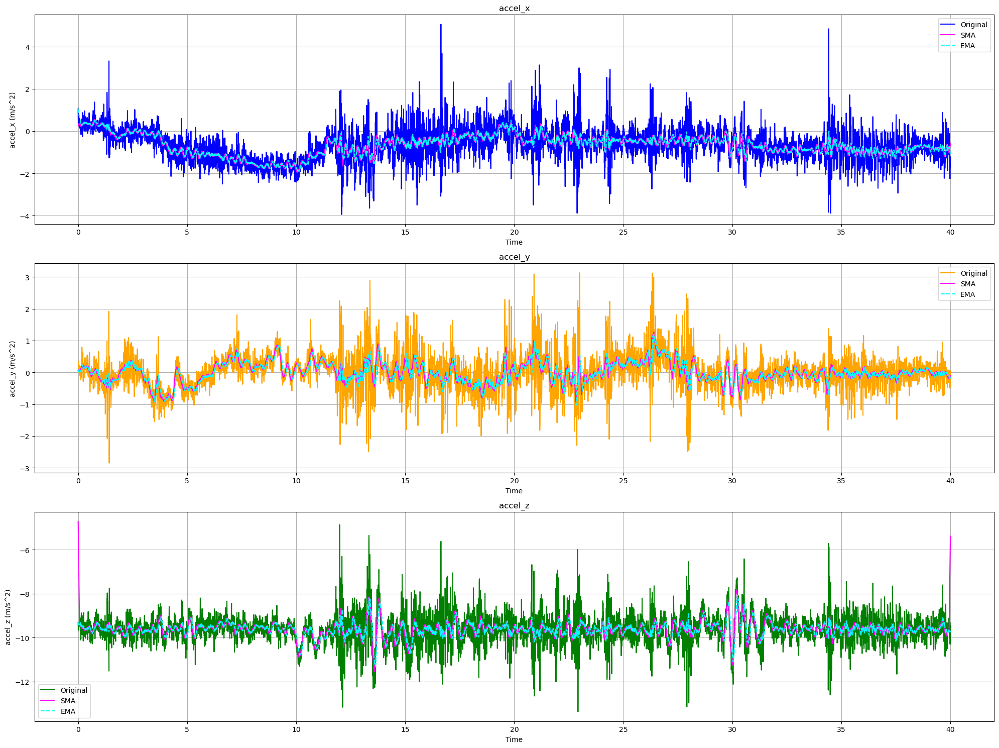

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value5')
data_t = np.load('t5')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [39]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set5 = []
set5_A = []
set5_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 0 and time < 7:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set5_A.append(morton)
            time_norm = time
            set5.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set5_B.append(morton)
            time_norm = time
            set5.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set5 = pd.DataFrame(set5, columns=['morton','timestamp'])
print(df_set5)


       morton  timestamp
0     1047784   0.006390
1     1048168   0.012779
2     2446536   0.019169
3     1048170   0.025579
4     1048288   0.031968
...       ...        ...
1089  2454592   6.969285
1090  2446914   6.975675
1091  2446434   6.982064
1092  2447082   6.988474
1093  2447072   6.994864

[1094 rows x 2 columns]


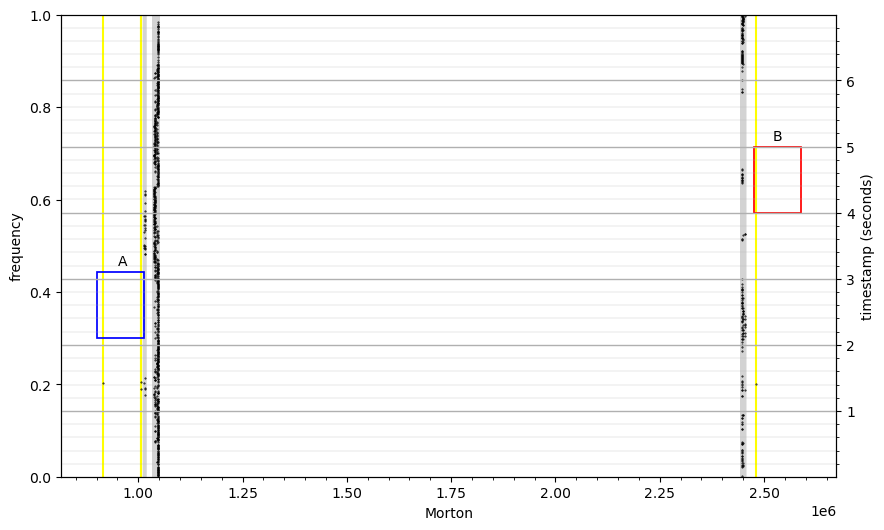

In [40]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set5_A, set5_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set5['morton']
timestamp_seconds = df_set5['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

1 right and 1 lest change 

For chunk 1, set value_37_b0c9d2329ad1606b|2018-08-02--08-34-47

For chunk 1, set value_38_b0c9d2329ad1606b|2018-08-02--08-34-47

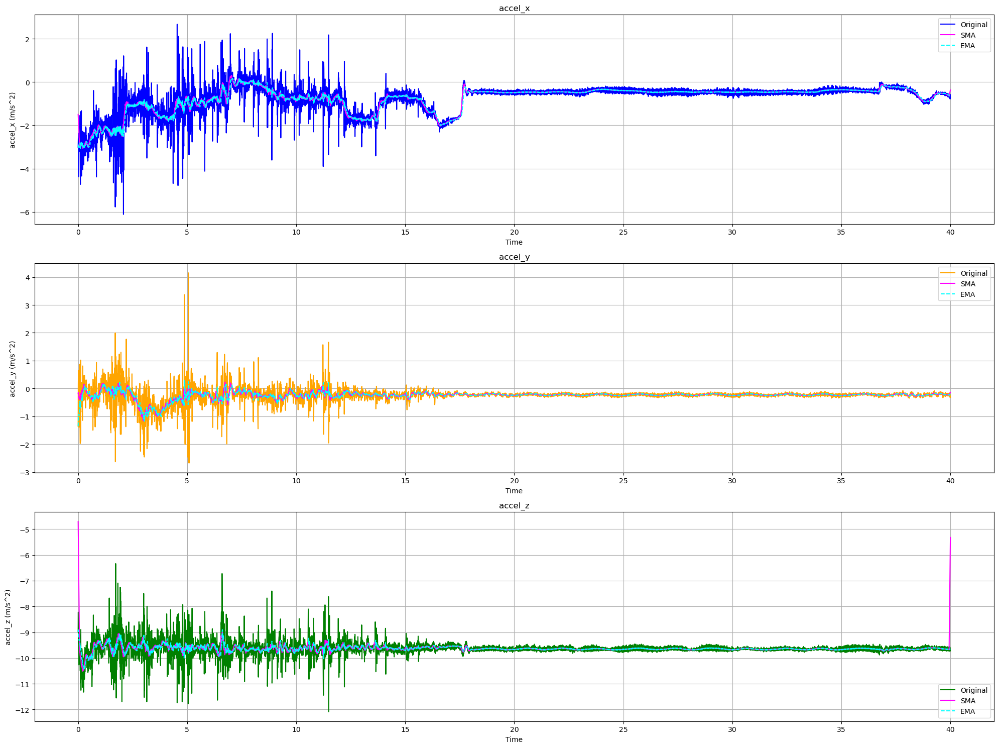

In [41]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_38_b0c9d2329ad1606b|2018-08-02--08-34-47')
data_t = np.load('t_38_b0c9d2329ad1606b|2018-08-02--08-34-47')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [42]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set38 = []
set38_A = []
set38_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 0 and time < 7:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set38_A.append(morton)
            time_norm = time
            set38.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set38_B.append(morton)
            time_norm = time
            set38.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set38 = pd.DataFrame(set38, columns=['morton','timestamp'])
print(df_set38)


       morton  timestamp
0     1048162   0.006411
1     2448578   0.012801
2     1048162   0.019191
3     1037514   0.025581
4     1037408   0.031992
...       ...        ...
1089  1048298   6.971618
1090  2446408   6.978008
1091  2447082   6.984419
1092  1047786   6.990809
1093  1047658   6.997199

[1094 rows x 2 columns]


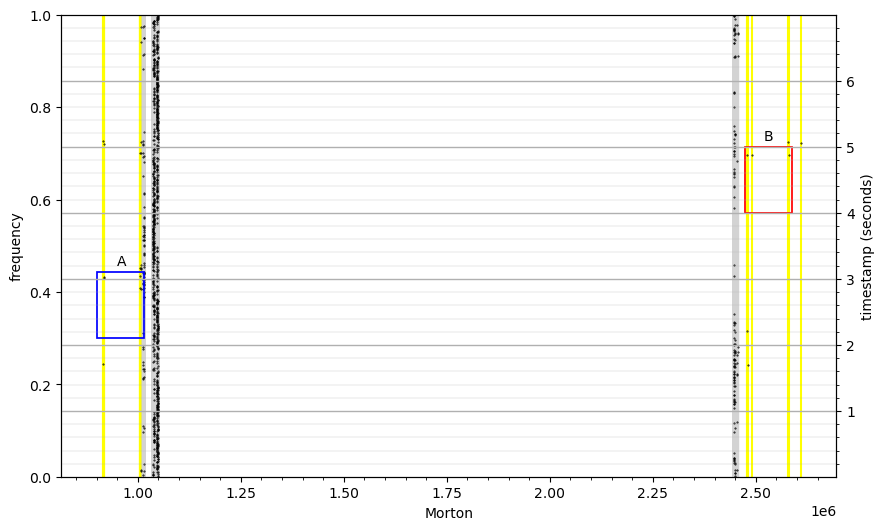

In [43]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set38_A, set38_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set38['morton']
timestamp_seconds = df_set38['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Not good example, the lane change is at the beginning from 0 - 3.5 but its unclear in the data

Chunk 1 for set t_31_b0c9d2329ad1606b|2018-08-06--10-04-53

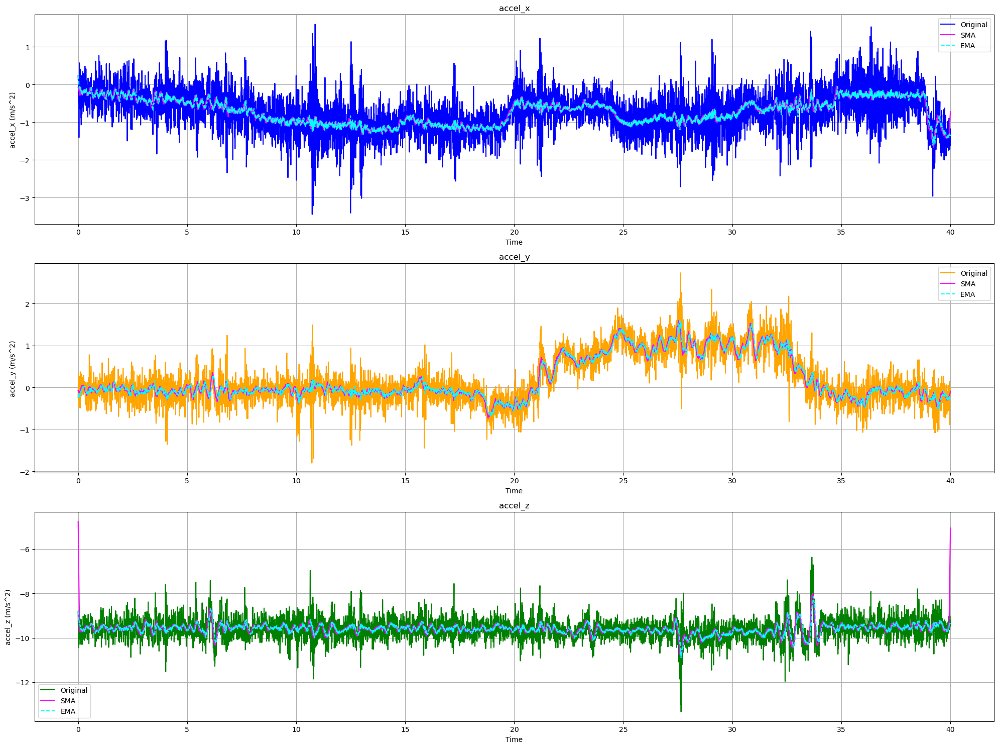

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_31_b0c9d2329ad1606b|2018-08-06--10-04-53')
data_t = np.load('t_31_b0c9d2329ad1606b|2018-08-06--10-04-53')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [45]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set31 = []
set31_A = []
set31_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 18 and time < 25:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set31_A.append(morton)
            time_norm = time - 18
            set31.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set31_B.append(morton)
            time_norm = time - 18
            set31.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set31 = pd.DataFrame(set31, columns=['morton','timestamp'])
print(df_set31)


       morton  timestamp
0     1039594   0.004555
1     1045728   0.010944
2     1047656   0.017353
3     1047648   0.023742
4     1040104   0.030131
...       ...        ...
1089  2479208   6.969716
1090  2479330   6.976126
1091  2479298   6.982515
1092  2457280   6.988904
1093  2454762   6.995293

[1094 rows x 2 columns]


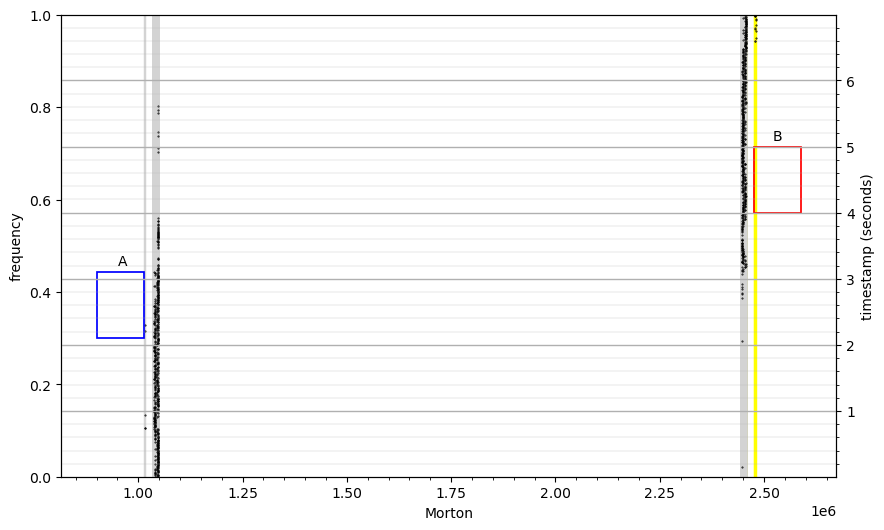

In [46]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set31_A, set31_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set31['morton']
timestamp_seconds = df_set31['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

We have a good lane change here starting from arond 18 to 22. However our theory does not seem to capture them as the threshold it to high once again. But we need to make surte that we compensate in that case for the possibilty that we also capture more noise. Thus some constraints needs to be added to adjust for this. What exactly do we need to add? That remains uncertain. 

Chunk 1 for set t_34_b0c9d2329ad1606b|2018-08-06--10-04-53, does 3 right lane changes.

Chunk 1 for set value4

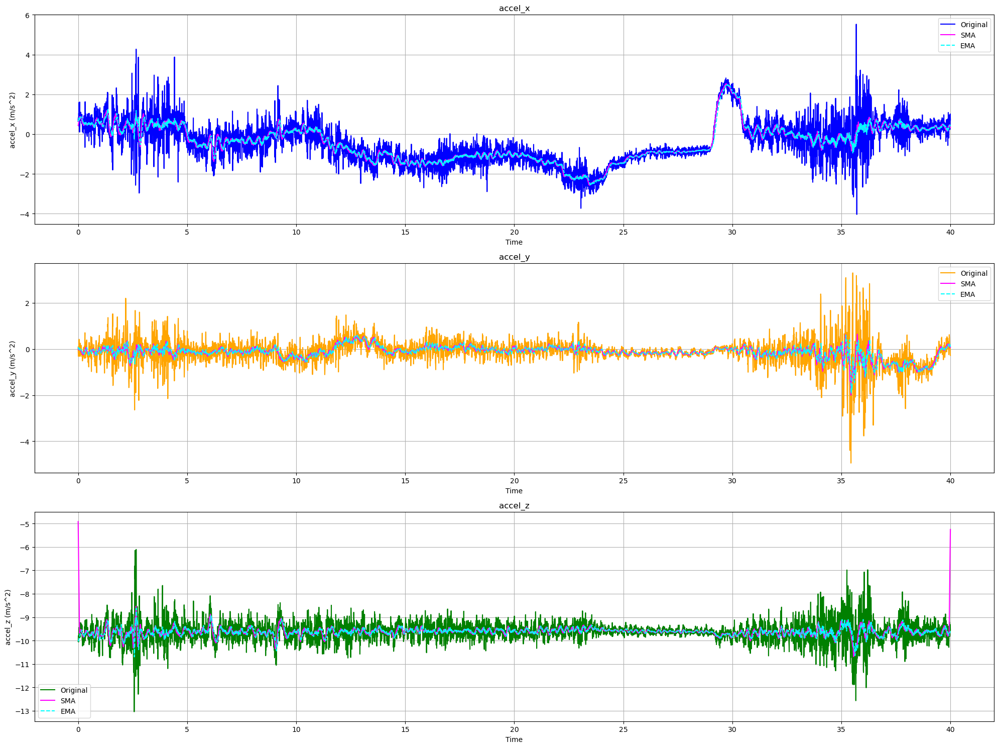

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value4')
data_t = np.load('t4')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [48]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set4 = []
set4_A = []
set4_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 8 and time < 15:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set4_A.append(morton)
            time_norm = time - 8
            set4.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set4_B.append(morton)
            time_norm = time - 8
            set4.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set4 = pd.DataFrame(set4, columns=['morton','timestamp'])
print(df_set4)


       morton  timestamp
0     1048258   0.004754
1     1048168   0.011143
2     1045696   0.017533
3     1045576   0.023922
4     1039944   0.030311
...       ...        ...
1090  1046120   6.973907
1091  1047778   6.980317
1092  1046082   6.986707
1093  2446408   6.993096
1094  1047648   6.999485

[1095 rows x 2 columns]


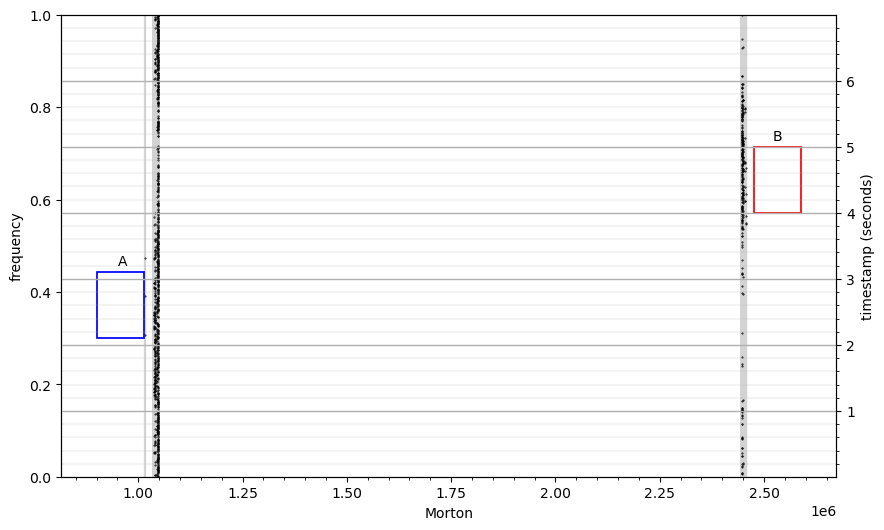

In [49]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set4_A, set4_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set4['morton']
timestamp_seconds = df_set4['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Once again we see that thethreshold is to high for the model to be able to detect the peaks for the left lane change. The lane change takes takes place between 9 - 12. 

Chunk 1 for set 37 b0c9d2329ad1606b|2018-08-14--10-32-01

Currently trying out different values for the threshold to see how we can adjust the results

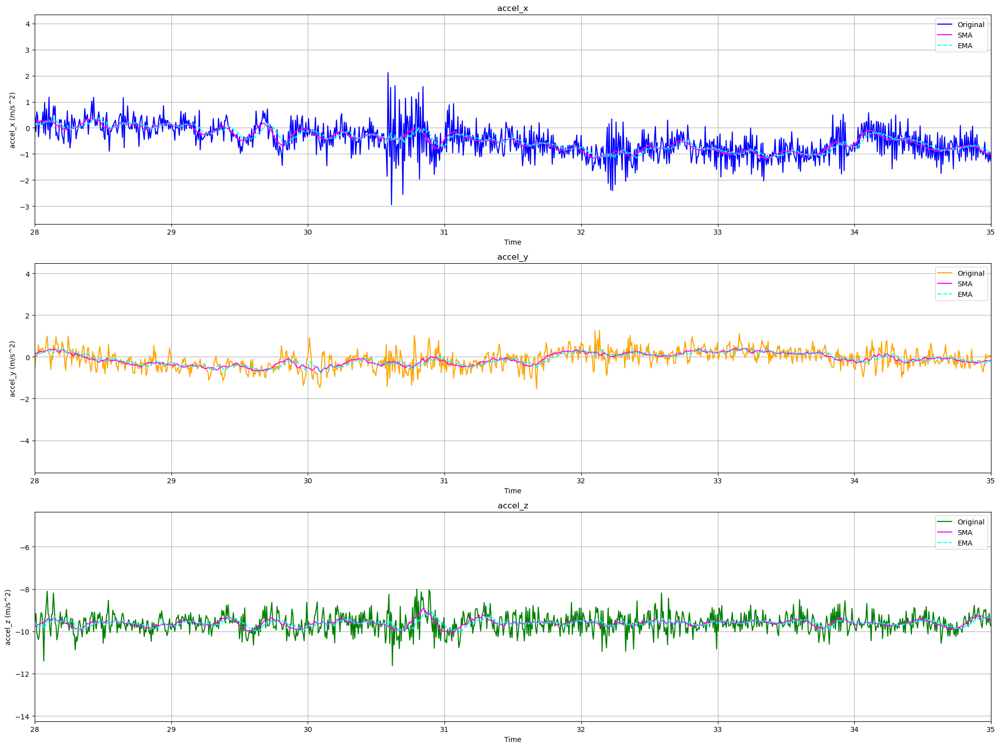

In [50]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_37_b0c9d2329ad1606b|2018-08-14--10-32-01')
data_t = np.load('t_37_b0c9d2329ad1606b|2018-08-14--10-32-01')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.xlim(28, 35)
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [51]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set37 = []
set37_A = []
set37_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 28 and time < 35:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set37_A.append(morton)
            time_norm = time - 28
            set37.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set37_B.append(morton)
            time_norm = time - 28
            set37.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set37 = pd.DataFrame(set37, columns=['morton','timestamp'])
print(df_set37)


       morton  timestamp
0     1040072   0.003249
1     1047778   0.009638
2     1047754   0.016027
3     1048160   0.022417
4     2448450   0.028806
...       ...        ...
1090  1047656   6.973630
1091  1047786   6.980019
1092  1047658   6.986409
1093  1047776   6.992798
1094  1047784   6.999208

[1095 rows x 2 columns]


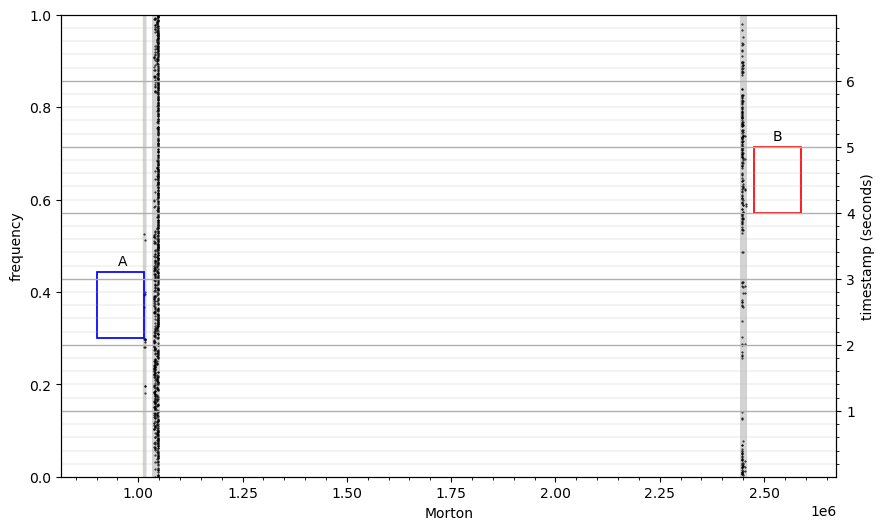

In [52]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set37_A, set37_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set37['morton']
timestamp_seconds = df_set37['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

The left lane change take place between 29 - 32 however, the threshold is too high. Also its a bit hard to find the lane change as its pattern is not that that explicit in the graph. 

Chunk 1 set 6 from b0c9d2329ad1606b|2018-08-16--21-52-30

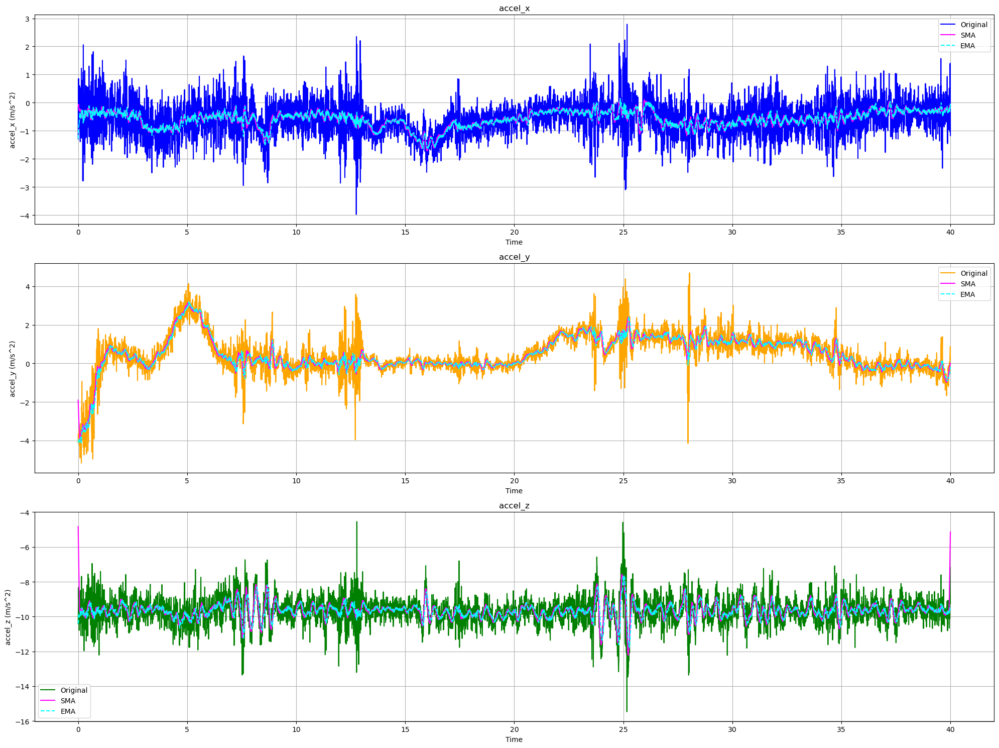

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_6_b0c9d2329ad1606b|2018-08-16--21-52-30')
data_t = np.load('t_6_b0c9d2329ad1606b|2018-08-16--21-52-30')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [54]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set6 = []
set6_A = []
set6_B = []
time18 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 9 and time < 16:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set6_A.append(morton)
            time_norm = time - 9
            set6.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set6_B.append(morton)
            time_norm = time - 9
            set6.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set6 = pd.DataFrame(set6, columns=['morton','timestamp'])
print(df_set6)


       morton  timestamp
0     1045610   0.002722
1     1046088   0.009111
2     1047648   0.015520
3     1046090   0.021909
4     1047624   0.028298
...       ...        ...
1090  1045730   6.971966
1091  1047658   6.978375
1092  1048130   6.984764
1093  1047624   6.991153
1094  1047616   6.997541

[1095 rows x 2 columns]


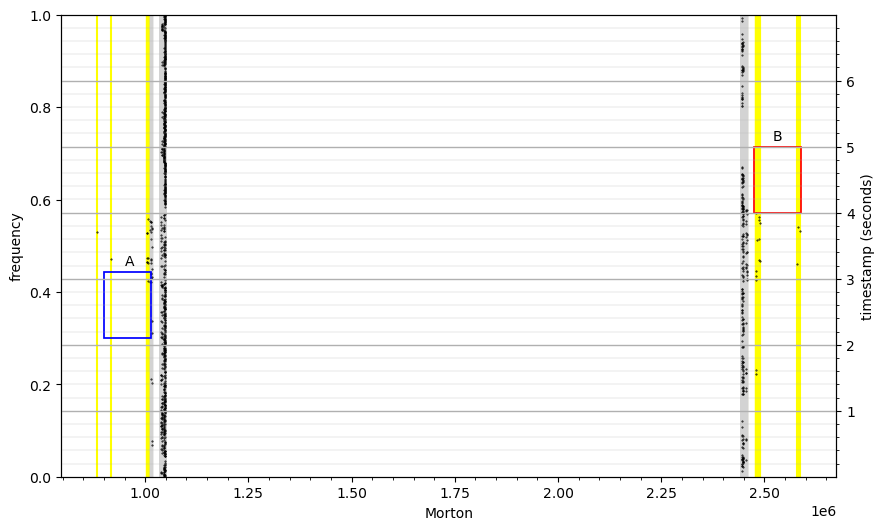

In [55]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set6_A, set6_B]
data_colors = ['yellow', 'lightgray']

morton18 = df_set6['morton']
timestamp_seconds = df_set6['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton18, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton18, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Here we can see that we are capturing the peaks that pass the threshold, however the time in which the lane change occurs is between 10.5 - 13 seconds. The peaks show up at aroudn 13 we guess. We are in a way capturing some of the interesting timestamps in box A but not B. How would we know what are FP and what are TP

Chunk 1 set 8 from b0c9d2329ad1606b|2018-08-16--21-52-30

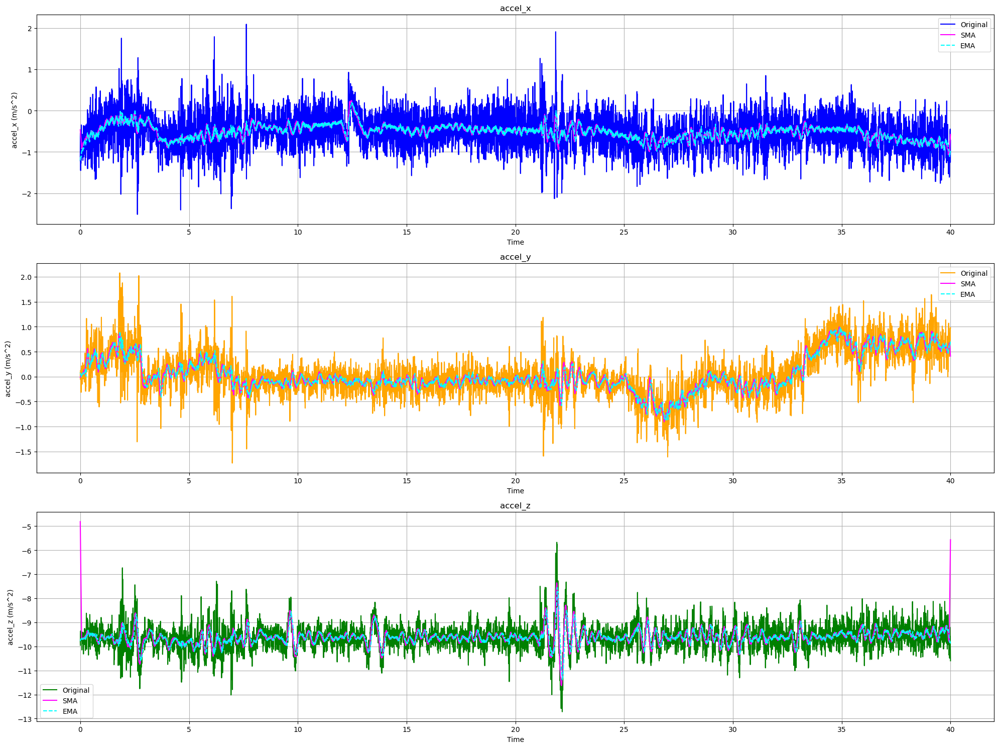

In [56]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_8_b0c9d2329ad1606b|2018-08-16--21-52-30')
data_t = np.load('t_8_b0c9d2329ad1606b|2018-08-16--21-52-30')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [57]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set8_1 = []
set8_A1 = []
set8_B1 = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 0 and time < 7:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set8_A1.append(morton)
            time_norm = time 
            set8_1.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set8_B1.append(morton)
            time_norm = time 
            set8_1.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set8_1 = pd.DataFrame(set8_1, columns=['morton','timestamp'])
print(df_set8_1)


       morton  timestamp
0     1047648   0.006389
1     1047624   0.012778
2     1048160   0.019167
3     1047648   0.025576
4     1046210   0.031965
...       ...        ...
1089  1040104   6.969523
1090  2479296   6.975952
1091  2448576   6.982341
1092  1007304   6.988730
1093  1012930   6.995119

[1094 rows x 2 columns]


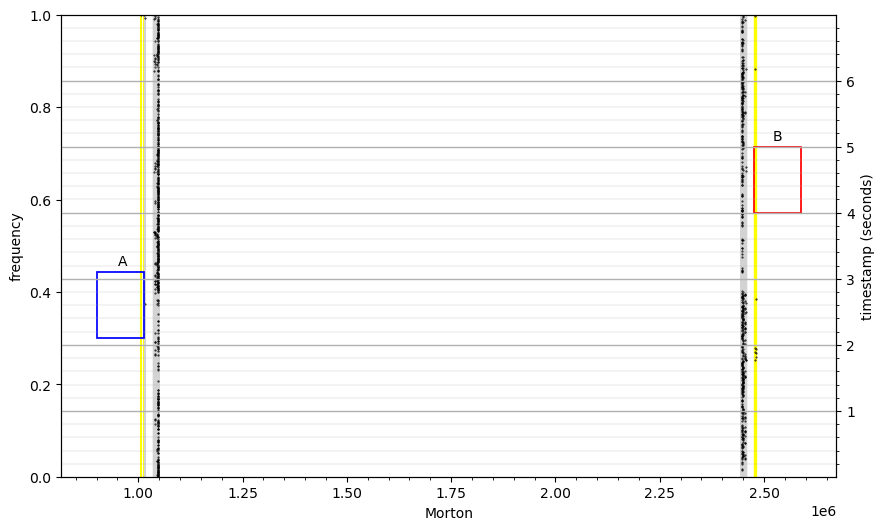

In [58]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set8_A1, set8_B1]
data_colors = ['yellow', 'lightgray']

morton17 = df_set8_1['morton']
timestamp_seconds = df_set8_1['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

The lane change takes place from 0 - 4.4 seconds. Dont really know what to say about this as it does seem to capture something. The lane change does not really look like a left lane change. 

Chunk 1 set 12 from b0c9d2329ad1606b|2018-08-17--14-17-47

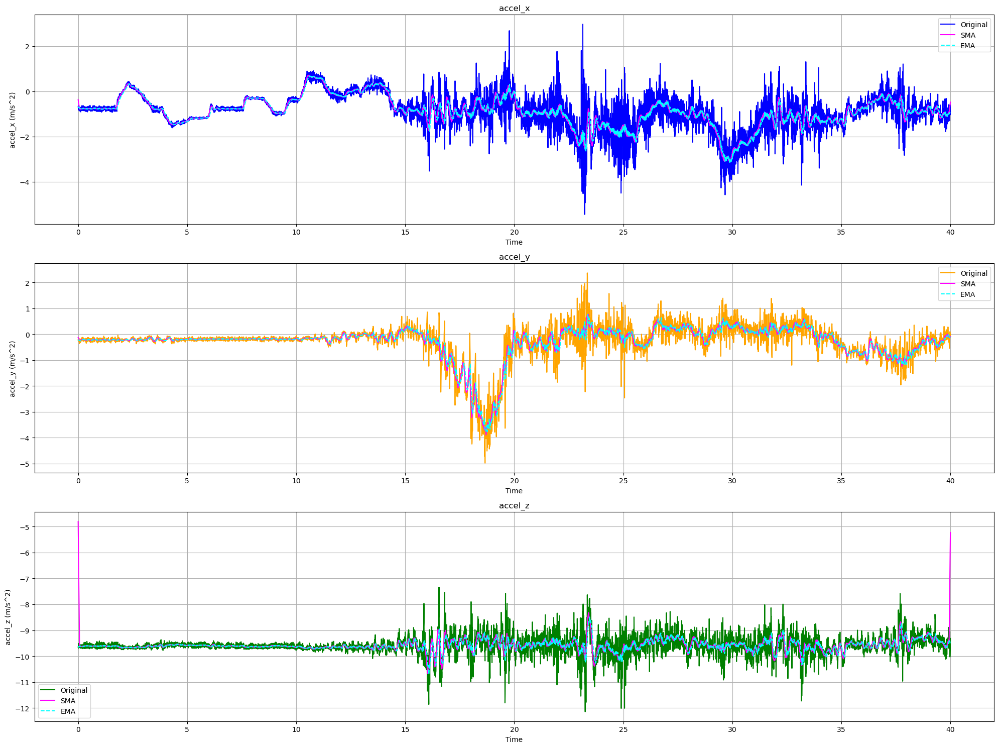

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_12_b0c9d2329ad1606b|2018-08-17--14-17-47')
data_t = np.load('t_12_b0c9d2329ad1606b|2018-08-17--14-17-47')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [60]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set12 = []
set12_A = []
set12_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 19 and time < 26:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set12_A.append(morton)
            time_norm = time - 19
            set12.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set12_B.append(morton)
            time_norm = time - 19
            set12.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set12 = pd.DataFrame(set12, columns=['morton','timestamp'])
print(df_set12)


       morton  timestamp
0      915176   0.005400
1      906472   0.011790
2      908514   0.018181
3      915178   0.024592
4      916714   0.030982
...       ...        ...
1089  1045698   6.971621
1090  1039554   6.978032
1091  1039426   6.984422
1092  1038056   6.990813
1093  1040106   6.997223

[1094 rows x 2 columns]


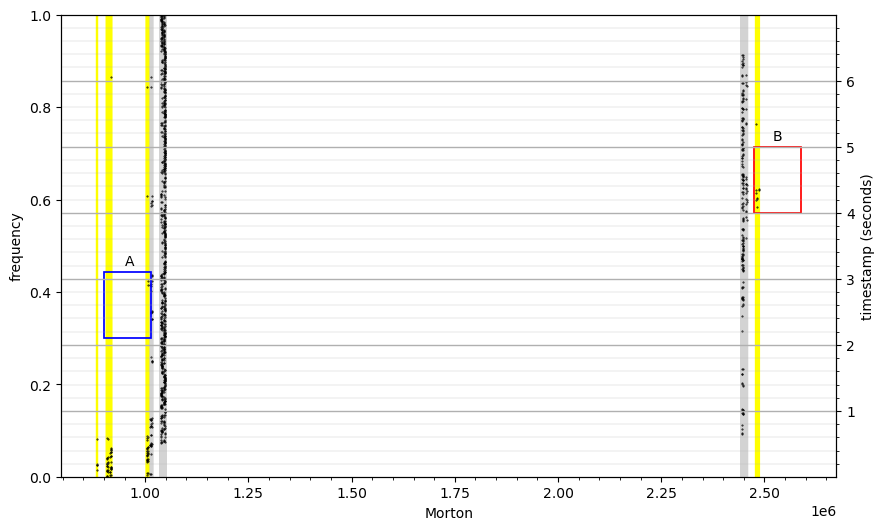

In [61]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set12_A, set12_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set12['morton']
timestamp_seconds = df_set12['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Chink 1 set 2 from b0c9d2329ad1606b|2018-08-17--14-55-39
It is a bad lane chage. He was standing still in traffic and it was slow. 

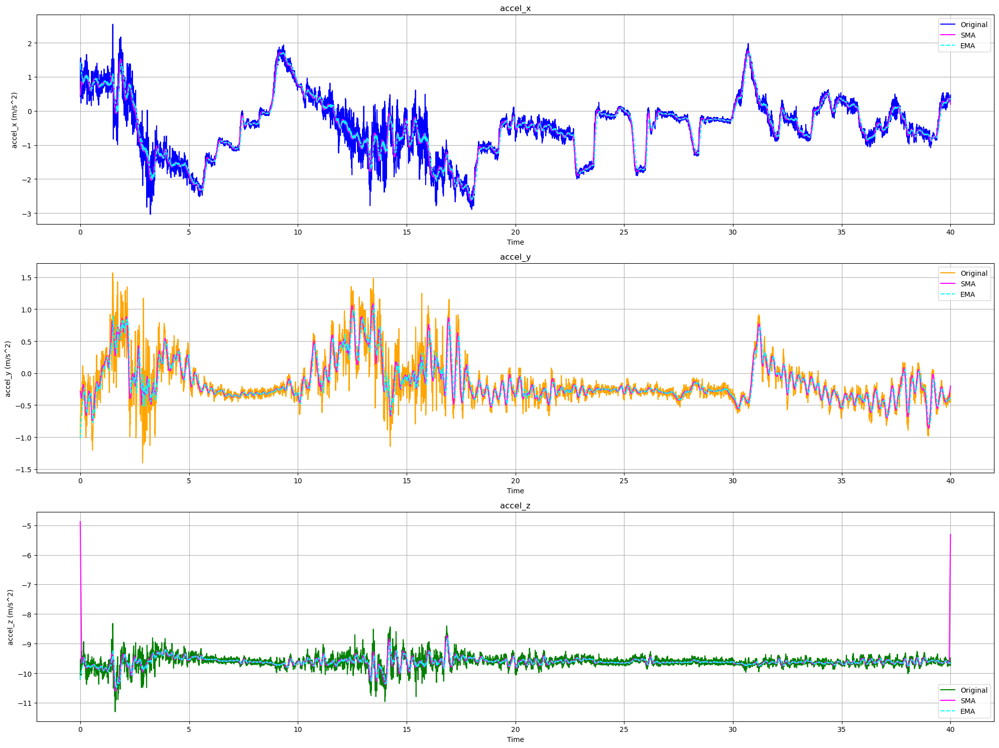

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_2_b0c9d2329ad1606b|2018-08-17--14-55-39')
data_t = np.load('t_2_b0c9d2329ad1606b|2018-08-17--14-55-39')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [63]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set2 = []
set2_A = []
set2_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 26 and time < 33:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set2_A.append(morton)
            time_norm = time - 26
            set2.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set2_B.append(morton)
            time_norm = time - 26
            set2.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set2 = pd.DataFrame(set2, columns=['morton','timestamp'])
print(df_set2)


       morton  timestamp
0     1045728   0.001631
1     1045696   0.008039
2     1045696   0.014427
3     1045706   0.020815
4     1045738   0.027203
...       ...        ...
1090  1046218   6.972038
1091  1046248   6.978426
1092  1047618   6.984834
1093  1046218   6.991222
1094  1046218   6.997610

[1095 rows x 2 columns]


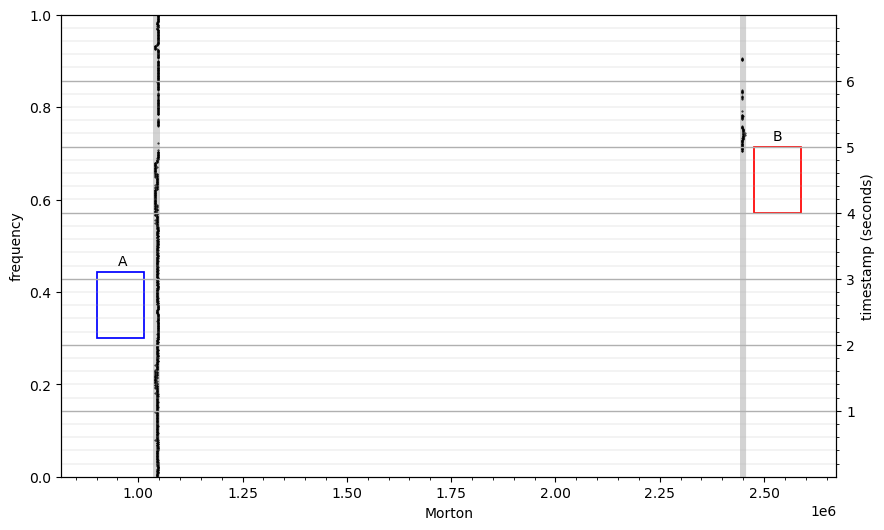

In [64]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set2_A, set2_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set2['morton']
timestamp_seconds = df_set2['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Chunk 1 set 35 from b0c9d2329ad1606b|2018-08-17--12-07-08

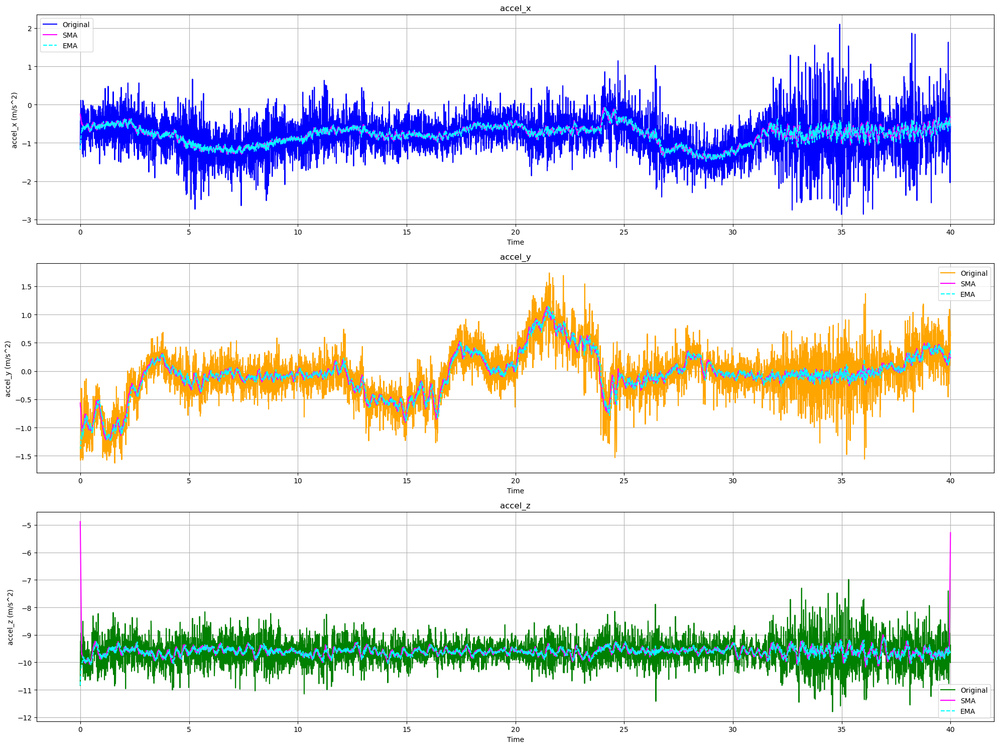

In [65]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_35_b0c9d2329ad1606b|2018-08-17--12-07-08')
data_t = np.load('t_35_b0c9d2329ad1606b|2018-08-17--12-07-08')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [66]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set35 = []
set35_A = []
set35_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 23 and time < 30:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set35_A.append(morton)
            time_norm = time - 23
            set35.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set35_B.append(morton)
            time_norm = time - 23
            set35.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set35 = pd.DataFrame(set35, columns=['morton','timestamp'])
print(df_set35)


       morton  timestamp
0     2448480   0.005025
1     2449000   0.011454
2     2448578   0.017843
3     2449090   0.024231
4     2449002   0.030620
...       ...        ...
1090  1045728   6.974318
1091  1047616   6.980707
1092  1046248   6.987095
1093  1046082   6.993483
1094  1046088   6.999872

[1095 rows x 2 columns]


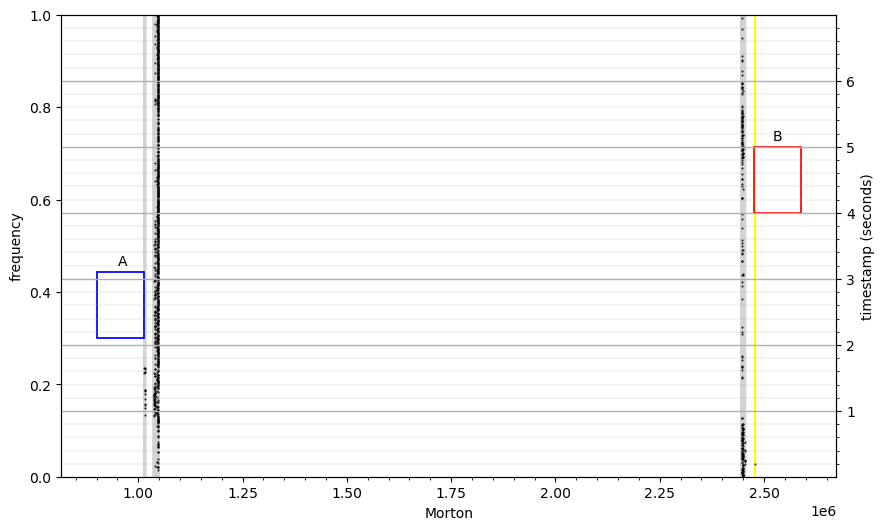

In [67]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set35_A, set35_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set35['morton']
timestamp_seconds = df_set35['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

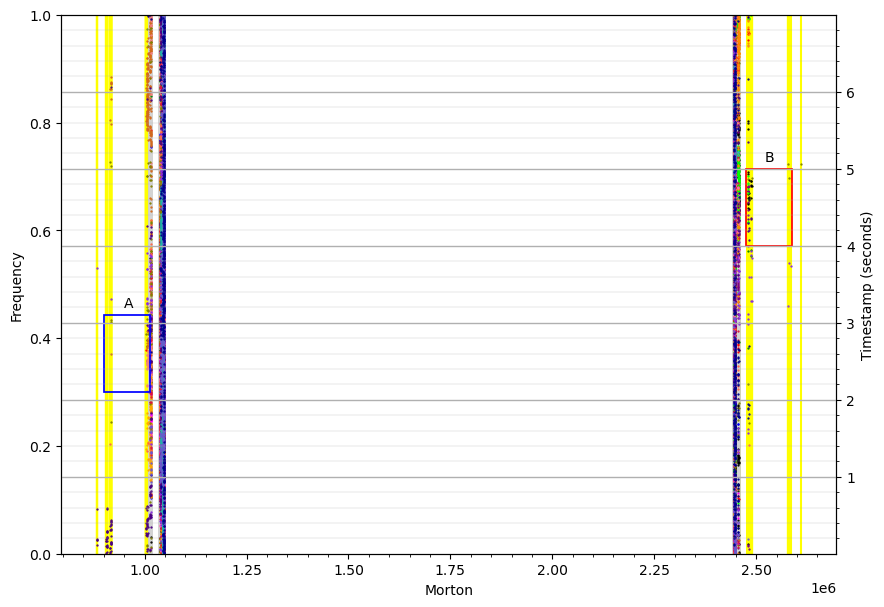

In [68]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_A, group_B]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set17, df_set21, df_set13, df_set8, df_set9, df_set10, df_set13_1, df_set42, df_set47,df_set2, df_set7, df_set5, df_set38, df_set31, df_set4, df_set37, df_set6, df_set12, df_set2, df_set35,df_set8_1]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
# plt.xlim(1e6, 1.02e6)
# plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['black', 'red', 'orange', 'blue','green','purple','chocolate','lime','magenta','cyan','lightcoral','tomato','olive','darkorange','hotpink','crimson','blueviolet','indigo','lightseagreen','slateblue','darkblue']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.13e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.13e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()